<center>

# **Land Cover Segmentation on Satellite and Aerial Images**

<center>

**Author: Joshua Ting**

**Github: [@justjoshtings](https://github.com/justjoshtings)**

**Data Science, Columbian College of Arts & Sciences, George Washington University**

**DATS6202 Final Course Project**

**Fall 2021**





## **Table of Contents**



1.   Introduction


        *   1.1 Motivation
        *   1.2 Problem
        *   1.3 Dataset Discovery
        *   1.4 Methodology Overview
        *   1.5 Brief Overview on Semantic Segmentation and Related Networks
2.   Set Up


        *   2.1 Google Drive
        *   2.2 Import Libraries and System Setup
        *   2.3 Set Up Data Directories
        *   2.4 Move Files
        *   2.5 Convert Masks to .png
        *   2.6 Cut up Mmages
        *   2.7 Class Weights
3.   Load Data


        *   3.1 Sanity Check
        *   3.2 Set Up Generators, Image Pre-Processing
4.   Build Model(s)


        *   4.1 U-Net Architecture
        *   4.2 Metrics, Loss, and Optimizer
        *   4.3 Model Implementation
        *   4.4 Model Training
        *   4.5 Transfer Learning
5.   Validation Results


        *   5.1 Learning Curves
        *   5.2 Optimal Model Validation Results
        *   5.3 U-Net Only Architecture Validation Results
        *   5.4 ResNet50_U-Net Architecture Validation Results
6.   Test Data


        *   6.1 ResNet50_U-Net Architecture Test Results
        *   6.2 U-Net Only Architecture Test Results

7.   Conclusion


        *   7.1 Model Performance
        *   7.2 Further Improvements
        *   7.3 Additional Areas to Explore
8.   References





## **1) Introduction**

#### **1.1) Motivation**

In our rapidly modernizing world, many areas of our Earth's land cover are being urbanized or turned into adjacent land use types like farms to support our growing population. These types of activities have a large negative impact on the precarious ecological and climate states of our planet.

Specifically, many ancient forests and other carbon sinks are being turned into cities and other mono-culture land use types.

Developing a method to monitor and track these activities can be crucial in gathering evidence and enacting policies to safeguard our planet's most crucial natural land cover types. Satellite imagery and other remote sensing data are invaluable in the fight against climate change in areas such as fighting deforestation, land use carbon accounting, icecap monitoring, and many others.

#### **1.2) Problem**

For this project, I will develop a artificial neural network trained on satellite imagery to classify the different land use types within that satellite image. This is a classic multiclass semantic segmentation problem on image data. 

Additionally, I wanted to use this project to gain hands-on valuable experience in working with satellite imagery data, image processing technqiues, and working with CNNs.


#### **1.3) Dataset Discovery**
The dataset used was obtained from [Kaggle](https://www.kaggle.com/balraj98/deepglobe-land-cover-classification-dataset) and the original source is from the [Land Cover Classification Track in DeepGlobe's 2018 Challenge](https://competitions.codalab.org/competitions/18468).

> Data:
*   The training data for Land Cover Challenge contains 803 satellite imagery in RGB, size 2448x2448. 
  * 2448x2448 is too large for our system to handle so it will need to be cut down into smaller patches per image.
*   The imagery has 50cm pixel resolution, collected by DigitalGlobe's satellite.
*   The dataset contains 171 validation and 172 test images (but no masks). 
  * We will combine the original validation and test images into a test dataset, split the train dataset, and appropriate a portion for validation with masks.

> Label:
*   Each satellite image is paired with a mask image for land cover annotation. The mask is a RGB image with 7 classes of labels, using color-coding (R, G, B) as follows.
    * Urban land: 0,255,255 - Man-made, built up areas with human artifacts (can ignore roads for now which is hard to label)
    * Agriculture land: 255,255,0 - Farms, any planned (i.e. regular) plantation, cropland, orchards, vineyards, nurseries, and ornamental horticultural areas; confined feeding operations.
    * Rangeland: 255,0,255 - Any non-forest, non-farm, green land, grass
    * Forest land: 0,255,0 - Any land with x% tree crown density plus clearcuts.
    * Water: 0,0,255 - Rivers, oceans, lakes, wetland, ponds.
    * Barren land: 255,255,255 - Mountain, land, rock, dessert, beach, no vegetation
    * Unknown: 0,0,0 - Clouds and others
* File names for satellite images and the corresponding mask image are id _sat.jpg and id _mask.png. id is a randomized integer.

> Data citation:
```
@InProceedings{DeepGlobe18,
 author = {Demir, Ilke and Koperski, Krzysztof and Lindenbaum, David and Pang, Guan and Huang, Jing and Basu, Saikat and Hughes, Forest and Tuia, Devis and Raskar, Ramesh},
 title = {DeepGlobe 2018: A Challenge to Parse the Earth Through Satellite Images},
 booktitle = {The IEEE Conference on Computer Vision and Pattern Recognition (CVPR) Workshops},
 month = {June},
 year = {2018}
}```



#### **1.4) Methodology Overview**

The overall methodology of this expriment is as follows:


1.   Download and explore data.
2.   Load data.
3.   Preprocess images where necessary.
4.   Select and build appropriate network architecture.
5.   Train on data and mask labels.
6.   Test performance on validation dataset.
7.   Tune parameters and hyperparameters of model where necessary.
8.   Repeat steps 6 & 7 until we have reached satisfactory results.
9.   Select the final trained model and test on test data.



#### **1.5) Brief Overview on Semantic Segmentation and Related Networks**
Before moving on to the actual project and code, let's briefly touch base on the idea of image segmentation which will help us better understand the decisions we make in our code.

Image segmentation is a particular type of computer vision problem where the task is to label specific regions of the image rather than the more common labeling of the entire image.

There are several types of image segmentation tasks. Some popular ones include:

1.   Object detection: Creating bounding boxes of objects in image.
2.   Semantic segmentation: Determining which pixels in image belong to which class.
3.   Instance segmentation: Determining which pixels in image belong to which class and if they belong to different instances of that class.

These types of tasks have wide ranging applications from medical radiology, to self driving cars, to photography masking, and much more.

Figures 1 and 2 below visually show how these image segmentation tasks differ from each other.

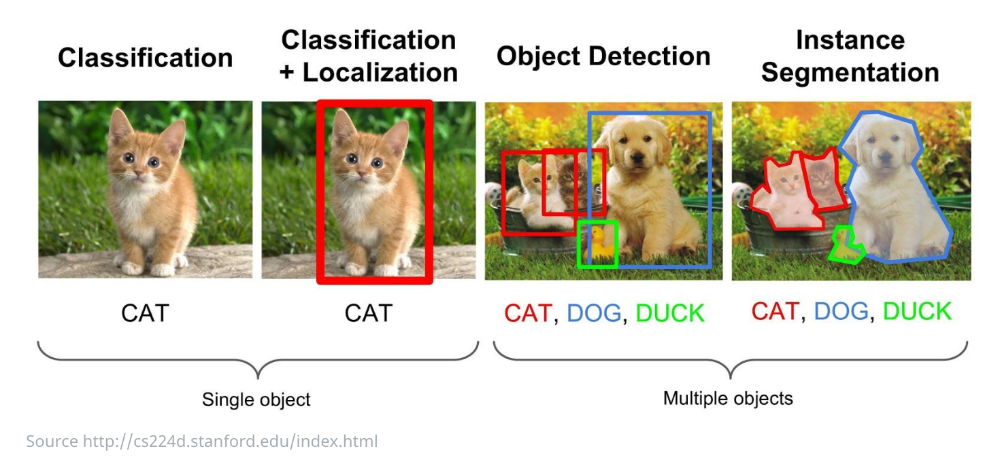

*Fig 1: Examples of image segmentation tasks. [Source](https://nanonets.com/blog/semantic-image-segmentation-2020/)*

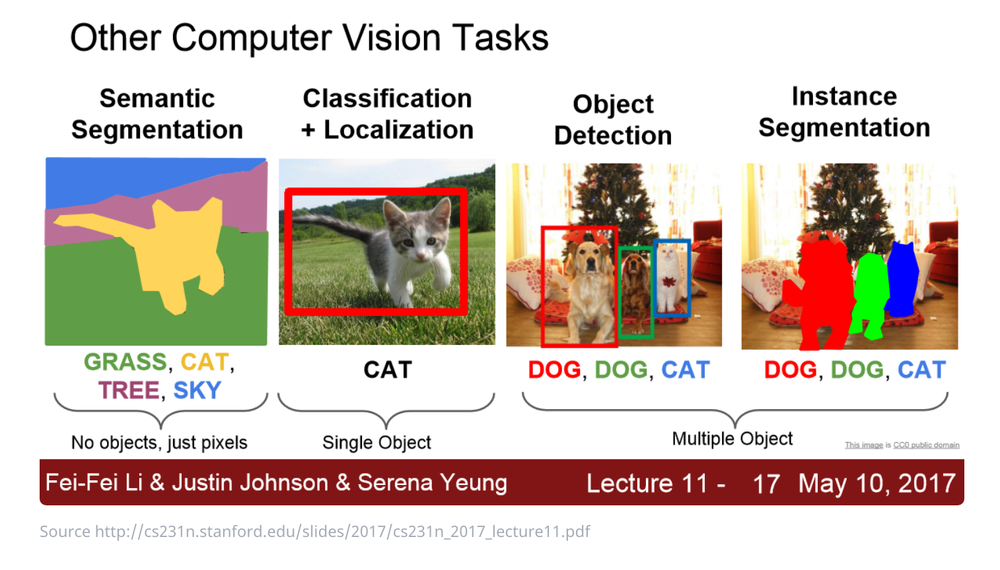

*Fig 2: More examples of image segmentation tasks. [Source](https://nanonets.com/blog/semantic-image-segmentation-2020/)*

In image segmentation, each pixel usually represents a unique class and can be visualized below in Figure 3.

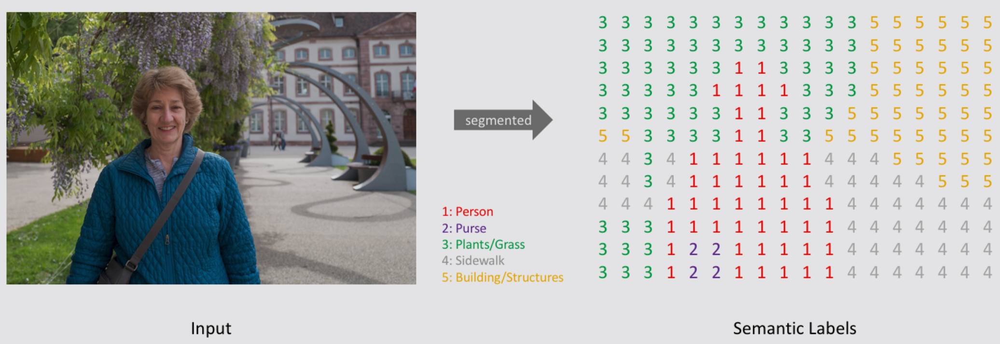

*Fig 3: Sample image and mask representation. [Source](https://www.jeremyjordan.me/semantic-segmentation/)*

Image semantic segmentation typically requires specialized Convolutional Neural Networks (CNNs) that differ slightly from regular image classification. Specifically, the CNN architectures needed for semantic segmentation require:

*   Pixel wise classification
*   Localization of objects within image

For these reasons, a [Long et al. (2015)'s Fully Convolutional Network (FCN)](https://arxiv.org/abs/1411.4038) is usually the backbone used for these tasks. A FCN is a CNN that does not contain any 'Dense' layers but are rather just stacking a number of Convolution layers to output a segmentation map. One downside to this type of architecture is that downsampling of the image in pooling layers loses the localization of objects within that image. This is not a problem for regular image classification problems where the location of the objects within that image are not as important as just what is in that image to begin with. 

We can ease this issue by adding an equivalent upsampling layers to each corresponding downsampling layer in order to preserve the location of an object at the ouput.

More resources about this subject can be found in the citations under *Additional resources for FCNs and Segmentation*.




After reading the literature and looking at similar open source community works, I have narrowed down the model that I want to use to [Ronneberger et al. (2015)'s U-Net](https://arxiv.org/abs/1505.04597) which is particularly good for image segmentation tasks. It was originally developed for segmenting biomedical images but is generally good for other segmentation tasks.

A U-Net is a particular implementation of a CNN that tries to workaround the issues mentioned in traditional CNNs as mentioned above. The architecture is shaped like a 'U', hence its name, and is composed of an Encoding and Decoding structure to downsample and upsample images.

It also utilizes skip connections between each downsampled and upsampled corresponding layers in order to keep localization of objects. Figure 4 below shows the diagram from the official U-Net paper.

More resources about this subject can be found in the citations under *Additional Resources for U-Nets*.

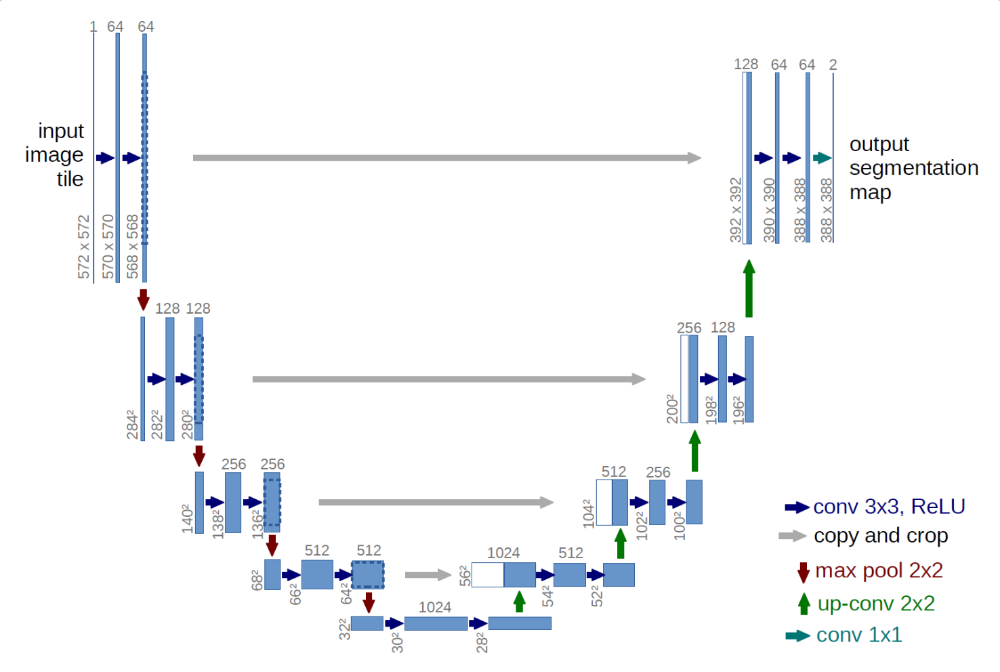

*Fig 4: Original U-Net architecture from Ronneberger et al. (2015)'s U-Net. [Source](https://arxiv.org/abs/1505.04597)*

## **2) Set Up**


#### **2.1) Google drive**



In [3]:
pip install tensorflow

  Using cached tensorflow-2.16.1-cp310-cp310-win_amd64.whl.metadata (3.5 kB)
  Using cached tensorflow_intel-2.16.1-cp310-cp310-win_amd64.whl.metadata (5.0 kB)
  Using cached astunparse-1.6.3-py2.py3-none-any.whl.metadata (4.4 kB)
  Using cached flatbuffers-24.3.25-py2.py3-none-any.whl.metadata (850 bytes)
  Using cached gast-0.5.4-py3-none-any.whl.metadata (1.3 kB)
  Using cached google_pasta-0.2.0-py3-none-any.whl.metadata (814 bytes)
  Using cached libclang-18.1.1-py2.py3-none-win_amd64.whl.metadata (5.3 kB)
  Using cached ml_dtypes-0.3.2-cp310-cp310-win_amd64.whl.metadata (20 kB)
  Using cached opt_einsum-3.3.0-py3-none-any.whl.metadata (6.5 kB)
  Using cached protobuf-4.25.3-cp310-abi3-win_amd64.whl.metadata (541 bytes)
  Using cached termcolor-2.4.0-py3-none-any.whl.metadata (6.1 kB)
  Using cached wrapt-1.16.0-cp310-cp310-win_amd64.whl.metadata (6.8 kB)
  Using cached grpcio-1.62.1-cp310-cp310-win_amd64.whl.metadata (4.2 kB)
  Using cached tensorboard-2.16.2-py3-none-any.whl.met

In [11]:
from google.colab import drive
import sys

# Mount Google Drive
drive.mount('/content/drive')

# Get the absolute path of the current folder
abspath_curr = '/content/drive/My Drive/Colab Notebooks/satellite_image_segmentation-main'

ModuleNotFoundError: No module named 'google.colab'

In [2]:
abspath_curr = 'C:/Users/aswin/Downloads/Compressed/satellite_image_segmentation-main/satellite_image_segmentation-main'

In [51]:
pip install tensorflow-gpu


  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'error'


  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [39 lines of output]
      Traceback (most recent call last):
        File "c:\Users\aswin\AppData\Local\Programs\Python\Python310\lib\site-packages\setuptools\_vendor\packaging\requirements.py", line 35, in __init__
          parsed = _parse_requirement(requirement_string)
        File "c:\Users\aswin\AppData\Local\Programs\Python\Python310\lib\site-packages\setuptools\_vendor\packaging\_parser.py", line 64, in parse_requirement
          return _parse_requirement(Tokenizer(source, rules=DEFAULT_RULES))
        File "c:\Users\aswin\AppData\Local\Programs\Python\Python310\lib\site-packages\setuptools\_vendor\packaging\_parser.py", line 82, in _parse_requirement
          url, specifier, marker = _parse_requirement_details(tokenizer)
        File "c:\Users\aswin\AppData\Local\Programs\Python\Python310\lib\site-packages\setuptools\_vendor\packaging\_parser.py", line 126,

#### **2.2) Import Libraries and System Setup**

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline 

#%tensorflow_version 2.x
import tensorflow as tf
from tensorflow import keras

import numpy as np
import pandas as pd
import os
import shutil
import math

from PIL import Image
import glob
import cv2
import pickle
import copy

import warnings
import random

In [4]:
# Ignore warnings
warnings.filterwarnings('ignore')

In [5]:
# Set matplotlib sizes
plt.rc('font', size=20)
plt.rc('axes', titlesize=20)
plt.rc('axes', labelsize=20)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.rc('legend', fontsize=20)
plt.rc('figure', titlesize=20)

In [6]:
# Random Seed

# The random seed
random_seed = 42

# Set random seed in tensorflow
tf.random.set_seed(random_seed)

# Set random seed in numpy
np.random.seed(random_seed)

In [7]:
# Check what version of TF we are using
print(tf.version.VERSION)

2.10.1


In [8]:
# Print the number of GPUs available
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

# Test to see if GPU is found and connected
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print('GPU device not found')
else:
  print('\nFound GPU at: {}'.format(device_name))
  print('\nCurrently using:')
  !nvidia-smi -L

Num GPUs Available:  0
GPU device not found


#### **2.3) Set Up Data Directories**

Before we can load data, we need make sure our directories of images and masks between train, val, and test are setup correctly.

Here is the framework that we want to set up in order to clearly separate our data and labels:


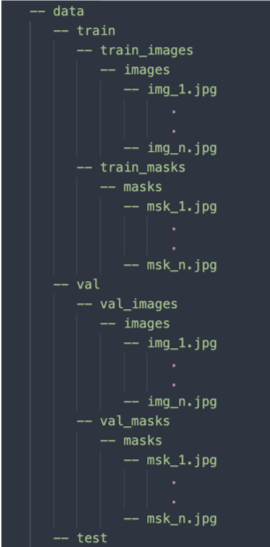

*Fig 5: Example directory structure*

In [9]:
meta_df = pd.read_csv(abspath_curr + "/data/metadata.csv")

meta_df.head()

,image_id,split,sat_image_path,mask_path
0,100694,train,train/100694_sat.jpg,train/100694_mask.png
1,102122,train,train/102122_sat.jpg,train/102122_mask.png
2,10233,train,train/10233_sat.jpg,train/10233_mask.png
3,103665,train,train/103665_sat.jpg,train/103665_mask.png
4,103730,train,train/103730_sat.jpg,train/103730_mask.png


In [10]:
class_df = pd.read_csv(abspath_curr + "/data/class_dict.csv")

class_df.head(10)

,name,r,g,b
0,urban_land,0,255,255
1,agriculture_land,255,255,0
2,rangeland,255,0,255
3,forest_land,0,255,0
4,water,0,0,255
5,barren_land,255,255,255
6,unknown,0,0,0


In [11]:
# 'Valid' does not have masks so let's merge that with the train and take a subset of train for validation
meta_df[meta_df['split'] == 'valid'].head()

,image_id,split,sat_image_path,mask_path
803,105036,valid,valid/105036_sat.jpg,NaN
804,107780,valid,valid/107780_sat.jpg,NaN
805,108490,valid,valid/108490_sat.jpg,NaN
806,127801,valid,valid/127801_sat.jpg,NaN
807,128240,valid,valid/128240_sat.jpg,NaN


In [12]:
# Update meta_df
meta_df['sat_image_path'] = meta_df['sat_image_path'].str.replace('valid/', 'test/')
meta_df['split'] = meta_df['split'].str.replace('valid', 'test')

In [12]:
# Create divides for train, test, val
train_df = meta_df[meta_df['split'] == 'train']

train_num_samples = round(len(train_df)*0.9)
val_num_samples = len(train_df) - train_num_samples

In [13]:
#shuffle all rows of DataFrame
train_df = train_df.sample(frac=1, random_state=random_seed).reset_index(drop=True)
train_df.head()

,image_id,split,sat_image_path,mask_path
0,315352,train,train/315352_sat.jpg,train/315352_mask.png
1,427774,train,train/427774_sat.jpg,train/427774_mask.png
2,28689,train,train/28689_sat.jpg,train/28689_mask.png
3,661864,train,train/661864_sat.jpg,train/661864_mask.png
4,675849,train,train/675849_sat.jpg,train/675849_mask.png


In [14]:
train_df['split'].iloc[:train_num_samples] = 'train'
train_df['split'].iloc[train_num_samples:] = 'valid'

In [15]:
non_train_df = meta_df[meta_df['split'] != 'train']

train_df['sat_image_path'] = train_df['sat_image_path'].str.replace('train/', 'train/train_images/images/')
train_df['mask_path'] = train_df['mask_path'].str.replace('train/', 'train/train_masks/masks/')

meta_df = pd.concat([train_df, non_train_df], axis=0)
meta_df.head()

,image_id,split,sat_image_path,mask_path
0,315352,train,train/train_images/images/315352_sat.jpg,train/train_masks/masks/315352_mask.png
1,427774,train,train/train_images/images/427774_sat.jpg,train/train_masks/masks/427774_mask.png
2,28689,train,train/train_images/images/28689_sat.jpg,train/train_masks/masks/28689_mask.png
3,661864,train,train/train_images/images/661864_sat.jpg,train/train_masks/masks/661864_mask.png
4,675849,train,train/train_images/images/675849_sat.jpg,train/train_masks/masks/675849_mask.png


In [16]:
non_valid_df = meta_df[meta_df['split'] != 'valid']
valid_df = meta_df[meta_df['split'] == 'valid']

valid_df['sat_image_path'] = valid_df['sat_image_path'].str.replace('train/train_images/images/', 'val/val_images/images/')
valid_df['mask_path'] = valid_df['mask_path'].str.replace('train/train_masks/masks/', 'val/val_masks/masks/')

meta_df = pd.concat([valid_df, non_valid_df], axis=0)
meta_df.head()

,image_id,split,sat_image_path,mask_path
723,325354,valid,val/val_images/images/325354_sat.jpg,val/val_masks/masks/325354_mask.png
724,277994,valid,val/val_images/images/277994_sat.jpg,val/val_masks/masks/277994_mask.png
725,699650,valid,val/val_images/images/699650_sat.jpg,val/val_masks/masks/699650_mask.png
726,549959,valid,val/val_images/images/549959_sat.jpg,val/val_masks/masks/549959_mask.png
727,889920,valid,val/val_images/images/889920_sat.jpg,val/val_masks/masks/889920_mask.png


Now we have labeled validation data to work with.

In [17]:
meta_df[meta_df['split'] == 'valid'].head()

,image_id,split,sat_image_path,mask_path
723,325354,valid,val/val_images/images/325354_sat.jpg,val/val_masks/masks/325354_mask.png
724,277994,valid,val/val_images/images/277994_sat.jpg,val/val_masks/masks/277994_mask.png
725,699650,valid,val/val_images/images/699650_sat.jpg,val/val_masks/masks/699650_mask.png
726,549959,valid,val/val_images/images/549959_sat.jpg,val/val_masks/masks/549959_mask.png
727,889920,valid,val/val_images/images/889920_sat.jpg,val/val_masks/masks/889920_mask.png


Our final dataset split will be this

In [18]:
print('Samples in train: ', len(meta_df[meta_df['split'] == 'train']))
print('Samples in validation: ', len(meta_df[meta_df['split'] == 'valid']))
print('Samples in test: ', len(meta_df[meta_df['split'] == 'test']))

Samples in train:  723
Samples in validation:  80
Samples in test:  343


This is what our classes look like.

In [13]:
class_df = pd.read_csv(abspath_curr + "/data/class_dict.csv")

class_df.head(10)

,name,r,g,b
0,urban_land,0,255,255
1,agriculture_land,255,255,0
2,rangeland,255,0,255
3,forest_land,0,255,0
4,water,0,0,255
5,barren_land,255,255,255
6,unknown,0,0,0


#### **2.4) Move Files**

Move images to their correct directories based on train, validation, and testing splits.

In [14]:
def make_directory(path):
  """
  Function to make directory if not exits

  Paramater:
    path - path of directory

  Return:
    None
  """
  directory = os.path.dirname(path)
  if not os.path.exists(directory):
    os.makedirs(directory)
  
  return


In [15]:
# Make directories
make_directory(abspath_curr + '/data/train/train_images/images/')
make_directory(abspath_curr + '/data/train/train_masks/masks/')

make_directory(abspath_curr + '/data/val/val_images/images/')
make_directory(abspath_curr + '/data/val/val_masks/masks/')

In [16]:
def move_files(list_filenames, source_path, target_path):
  """
  Function to move files from source to target directory based on a list of filenames within source

  Parameters:
    list_filesname - list of filenames
    source_path - path of source directory
    target_path - path of target directory

  Return:
    None
  """
  for file_name in list_filenames:
      try:
        shutil.move(os.path.join(source_path, file_name), os.path.join(target_path, file_name))
      except FileNotFoundError:
        continue

In [17]:
# List of test, val filenames
train_sat_img_path = meta_df[meta_df['split'] == 'train']['sat_image_path']
train_sat_img_path = train_sat_img_path.str.replace('train/train_images/images/', '')

new_val_sat_img_path = meta_df[meta_df['split'] == 'valid']['sat_image_path']
new_val_sat_img_path = new_val_sat_img_path.str.replace('val/val_images/images/', '')

train_msk_img_path = meta_df[meta_df['split'] == 'train']['mask_path']
train_msk_img_path = train_msk_img_path.str.replace('train/train_masks/masks/', '')

new_val_msk_img_path = meta_df[meta_df['split'] == 'valid']['mask_path']
new_val_msk_img_path = new_val_msk_img_path.str.replace('val/val_masks/masks/', '')

old_val_img_path = os.listdir(abspath_curr + '/data/valid/')


In [18]:
def folder_is_empty(path, img_types=['.png', '.jpg', '.tif']):
  """
  Function to check if a filepath is empty

  Parameters:
    path - filepath to image or mask data

  Return:
    True if empty, False if not

  We can use this function like this:
    if not False:
      do X
    else:
      do Y
    
  this will do X.
  """

  if any(list(map(lambda x: True if x in ''.join(os.listdir(path)) else False, img_types))):
    return False
  else:
    return True

In [19]:
# Moves files from main folders of train, val to sub-directories

# Old validation goes to test
if not folder_is_empty(abspath_curr + '/data/valid'):
  # image
  move_files(old_val_img_path, abspath_curr + '/data/valid/', abspath_curr + '/data/test')

# Split old train to new train and new val
if not folder_is_empty(abspath_curr + '/data/train'):
  # train_image
  move_files(train_sat_img_path, abspath_curr + '/data/train/', abspath_curr + '/data/train/train_images/images')
  # train_mask
  move_files(train_msk_img_path, abspath_curr + '/data/train/', abspath_curr + '/data/train/train_masks/masks')

  # val_image
  move_files(new_val_sat_img_path, abspath_curr + '/data/train/', abspath_curr + '/data/val/val_images/images')
  # val_mask
  move_files(new_val_msk_img_path, abspath_curr + '/data/train/', abspath_curr + '/data/val/val_masks/masks')  



In [20]:
# Check if images got moved right
print('Train Images: ', len(os.listdir(abspath_curr + '/data/train/train_images/images')))
print('Train Masks: ',len(os.listdir(abspath_curr + '/data/train/train_masks/masks')))

print('Val Images: ',len(os.listdir(abspath_curr + '/data/val/val_images/images')))
print('Val Masks: ',len(os.listdir(abspath_curr + '/data/val/val_masks/masks')))

print('Test Images: ',len(os.listdir(abspath_curr + '/data/test')))
print('Test Masks: ',len(os.listdir(abspath_curr + '/data/test')))

Train Images:  723
Train Masks:  723
Val Images:  80
Val Masks:  80
Test Images:  343
Test Masks:  343


#### **2.5) Convert masks to .png to prevent loss and generally preferred over .jpg**

Masks are generally preferred to be in .png format. We convert to .png if the masks were not already in .png format.

In [21]:
def convert_file_type(filepath, dest_file_type):
  """
  Function to convert all files in a directory to a defined file type

  Parameters:
    filepath - filepath
    dest_file_type - str of dest_file_type ('.png')

  Return:
    None
  """
  for mask_file in os.listdir(filepath):
    try:
        # Attempt to open an image file
        image = cv2.imread(filepath + '/' + mask_file)
    except IOError as e:
        # Report error, and then skip to the next argument
        print ("Problem opening", mask_file, ":", e)
        continue

    # Split our original filename into name and extension
    (name, extension) = os.path.splitext(mask_file)
    
    # Save new file type
    cv2.imwrite(filepath + '/' + name + dest_file_type, image)
    
    # Delete original copy
    os.remove(filepath + '/' + mask_file)

In [22]:
# If .jpg or .tif found in masks directories, convert them into .png type

if not folder_is_empty(abspath_curr + '/data/train/train_masks/masks', img_types=['.jpg', '.tif']):
  convert_file_type(abspath_curr + '/data/train/train_masks/masks', '.png')
  
if not folder_is_empty(abspath_curr + '/data/val/val_masks/masks', img_types=['.jpg', '.tif']):
  convert_file_type(abspath_curr + '/data/val/val_masks/masks', '.png')

#### **2.6) Cut up images to have more samples and smaller training features**

Since the original images are 2448x2448x3, it requires a lot of computing resources to be loaded at a time to train just one image. Instead, we can cut up the images into smaller patches to reduce the amount of computing resources needed to load one image into memory and train.

In [23]:
def cut_images(filepath, dest_filepath, n_sub_images):
  """
  Function to convert all masks to only forest labeled masks

  Parameters:
    filepath - source filepath
    dest_filepath - destination filepath
    n_sub_images - number of images to cut

  Return:
    None
  """
  for mask_file in os.listdir(filepath):
    try:
        # Attempt to open an image file
        image = plt.imread(filepath + '/' + mask_file)
    except IOError as e:
        # Report error, and then skip to the next argument
        print ("Problem opening", mask_file, ":", e)
        continue

    pixels = int(image.shape[0] / math.sqrt(n_sub_images))
    
    count = 0

    for r in range(0,image.shape[0],pixels):
      for c in range(0,image.shape[1],pixels):

        filename = mask_file.split('.')[0]
        extension = mask_file.split('.')[1]

        # Save new file type
        plt.imsave(dest_filepath + filename + '_{}.'.format(count) + extension, image[r:r+pixels, c:c+pixels,:])

        count+=1
    
    os.remove(filepath + '/' + mask_file)
  print('Images of: {}x{}'.format(pixels, pixels))

In [24]:
run_cut_images = False

if run_cut_images:
  # Images
  cut_images(abspath_curr + '/data/train/train_images/images/', abspath_curr + '/data/train/train_images/images/', 16)
  cut_images(abspath_curr + '/data/val/val_images/images/', abspath_curr + '/data/val/val_images/images/', 16)
  cut_images(abspath_curr + '/data/test/', abspath_curr + '/data/test/', 16)

  # Masks
  cut_images(abspath_curr + '/data/train/train_masks/masks/', abspath_curr + '/data/train/train_masks/masks/', 16)
  cut_images(abspath_curr + '/data/val/val_masks/masks/', abspath_curr + '/data/val/val_masks/masks/', 16)

In [25]:
# Check if images got moved right
print('Train Images: ', len(os.listdir(abspath_curr + '/data/train/train_images/images')))
print('Train Masks: ',len(os.listdir(abspath_curr + '/data/train/train_masks/masks')))

print('Val Images: ',len(os.listdir(abspath_curr + '/data/val/val_images/images')))
print('Val Masks: ',len(os.listdir(abspath_curr + '/data/val/val_masks/masks')))

print('Test Images: ',len(os.listdir(abspath_curr + '/data/test')))

Train Images:  723
Train Masks:  723
Val Images:  80
Val Masks:  80
Test Images:  343


#### **2.7) Class Weights**

Let's take a look at the class imbalance/balance. We will look at the number of pixels that belongs to each class.

In [26]:
def get_pixels_class_weights(path, class_map):
  """
  Function to go to specified mask path, go through each image 
  and count number of pixels that belong to each class

  Parameters:
    paths: path to images
    class_map: class_df

  Return:
    pixel_counts: np array of pixel counts in order of class appearance in class_df 
  """
  images = os.listdir(path)

  pixel_counts = np.zeros(len(class_map))

  # Iterate through image
  for image in images:
    img = plt.imread(path+image)
    
    # Iterate through class_map
    class_counter = 0
    for index, row in class_df.iterrows():
        new_img = copy.deepcopy(img[::,::,::])

        R = new_img[::,::,0]
        G = new_img[::,::,1]
        B = new_img[::,::,2]

        #method to check where rgb = 0, 255, 255 etc, subset it & np.count_nonzero
        count = (new_img[(R == row['r']/255) & (G == row['g']/255) & (B == row['b']/255)].size)/3

        # add count to array
        pixel_counts[class_counter]+=count

        class_counter+=1
  
  return pixel_counts

def pixels_class_weights(paths_list, save_path, class_map=None):
  """
  Function to get pixels class weights for classes

  Parameters:
    paths_list: list of paths
    class_map: class_df

  Return:
    class_pixels: pandas df of classes and percentage of pixels belonging to that class
  """
  class_pixels = class_map.copy()
  class_pixels['Pixels_Count'] = 0

  for counter, path in enumerate(paths_list):
    pixels_count_array = get_pixels_class_weights(path, class_map)
    # hstack each array to df, sum columns and drop stacked column
    class_pixels['Pixels_Count_{}'.format(counter)] = pixels_count_array.tolist()
    class_pixels['Pixels_Count'] = class_pixels['Pixels_Count'] + class_pixels['Pixels_Count_{}'.format(counter)]
    # drop rgb cols in df
    class_pixels.drop('Pixels_Count_{}'.format(counter), axis=1, inplace=True)

  # Percentage of pixels in each class
  class_pixels['Weights'] = round(class_pixels['Pixels_Count']/class_pixels['Pixels_Count'].sum(), 2)
  
  # Weighting to use for calculating loss
  class_pixels['True Weights'] = (1 / class_pixels['Pixels_Count']) * class_pixels['Pixels_Count'].sum()/class_pixels.shape[0]
  class_pixels.loc[6,'True Weights'] = 0.001
  
  # Save results
  make_directory(save_path)
  class_pixels.to_csv(save_path+'class_pixels_count.csv', index=False)

  return class_pixels

run_class_pixels = True

if run_class_pixels:
  class_pixels = pixels_class_weights([abspath_curr + '/data/train/train_masks/masks/', ], 
                                      abspath_curr + '/result/class_distribution/', 
                                      class_map=class_df)

else:
  class_pixels = pd.read_csv(abspath_curr + '/result/class_distribution/class_pixels_count.csv')

print(class_pixels.head(10))


               name    r    g    b  Pixels_Count  Weights  True Weights
0        urban_land    0  255  255  4.629777e+08     0.11      1.336912
1  agriculture_land  255  255    0  2.493863e+09     0.58      0.248194
2         rangeland  255    0  255  3.650068e+08     0.08      1.695751
3       forest_land    0  255    0  4.970391e+08     0.11      1.245296
4             water    0    0  255  1.513964e+08     0.03      4.088346
5       barren_land  255  255  255  3.600005e+08     0.08      1.719333
6           unknown    0    0    0  2.441748e+06     0.00      0.001000


Here are the number and percentage of pixels that belong to each class. Note that the highest is the agriculture class where 58% of the pixels belong to this class. We will see how this affects our model's performance.

In [34]:
# run_class_pixels = False

# if run_class_pixels:
#   class_pixels = pixels_class_weights([abspath_curr + '/data/train/train_masks/masks/', ], 
#                                       abspath_curr + '/result/class_distribution/', 
#                                       class_map=class_df)

# else:
#   class_pixels = pd.read_csv(abspath_curr + '/result/class_distribution/class_pixels_count.csv')

# print(class_pixels.head(10))

## **3) Load Data**

#### **3.1) Sanity Check**

In [27]:
#Sanity check, view few mages
def peek_images(sample_images, sample_masks=None, encode=None, color_scale=None, file_name=None, mask_name=None, predict=None, model=None, sample_images2=None, model_alt=None):
  """
  Function to plot a randomly selected training set (or validation set if given validation filepaths)

  Parameters:
    sample_images: image in np array
    sample_masks: mask in np array
    encode: Boolean to set encoding type 'uint8' or not
    color_scale: set to 'gray' to set grayscale
    file_name: filename to display in image plot tile
    mask_name: filename to display in mask plot tile
    predict: Boolean, set to True if want to show prediction plots
    model: instance of Keras model object to use .predict() on

  Return:
    None
  """
  image_number = random.randint(0, sample_images.shape[0]-1)

  plt.figure(figsize=(12, 6))
  
  # Original Image
  if predict is not None and model is not None and model_alt is not None:
    plt.subplot(141)
  elif predict is not None and model is not None and model_alt is None:
    plt.subplot(131)
  else:
    plt.subplot(121)

  if encode == 'uint8':
    plt.imshow(sample_images.astype(('uint8')))
  else:
    plt.imshow(sample_images)
  plt.title('Original:\n{}'.format(file_name), fontdict = {'fontsize' : 8})
  plt.axis('off')
  
  # Mask
  if predict is not None and model is not None and model_alt is not None:
    plt.subplot(142)
  elif predict is not None and model is not None and model_alt is None:
    plt.subplot(132)
  else:
    plt.subplot(122)

  if encode == 'uint8':
    if color_scale == 'gray':
      plt.imshow(sample_masks.astype(('uint8')), cmap='gray')
    else:
      plt.imshow(sample_masks.astype(('uint8')))
  else:
    if color_scale == 'gray':
      plt.imshow(sample_masks, cmap='gray')
    else:
      plt.imshow(sample_masks)
  plt.title('Ground Truth Mask:\n{}'.format(mask_name), fontdict = {'fontsize' : 8})
  plt.axis('off')

  if predict is not None and model is not None and model_alt is not None:
    plt.subplot(143)
  if predict is not None and model is not None and model_alt is None:
    plt.subplot(133)
    # Prediction

  if predict is not None:
    # Turn (612, 612, 3) to (1, 612, 612, 3)
    if len(sample_images.shape) == 3:
      sample_images = np.expand_dims(sample_images, axis=0)

    # Predict image
    predicted_image = model.predict(sample_images)
    predicted_image = predicted_image[0,::,::,::]
    # Reverse one hot encode predicted mask
    predicted_image_decoded = reverse_one_hot_encode(predicted_image)

    
    if encode == 'uint8':
      if color_scale == 'gray':
        plt.imshow(predicted_image_decoded.astype(('uint8')), cmap='gray')
      else:
        plt.imshow(predicted_image_decoded.astype(('uint8')))
    else:
      if color_scale == 'gray':
        plt.imshow(predicted_image_decoded, cmap='gray')
      else:
        plt.imshow(predicted_image_decoded)
    plt.title('Predicted Mask {}:'.format(model.name), fontdict = {'fontsize' : 8})
    plt.axis('off')

  if predict is not None and model is not None and model_alt is not None:
    # Prediction #2

    # Turn (612, 612, 3) to (1, 612, 612, 3)
    if len(sample_images2.shape) == 3:
      sample_images2 = np.expand_dims(sample_images2, axis=0)

    # Predict image
    predicted_image = model_alt.predict(sample_images2)
    predicted_image = predicted_image[0,::,::,::]
    # Reverse one hot encode predicted mask
    predicted_image_decoded = reverse_one_hot_encode(predicted_image)

    plt.subplot(144)
    if encode == 'uint8':
      if color_scale == 'gray':
        plt.imshow(predicted_image_decoded.astype(('uint8')), cmap='gray')
      else:
        plt.imshow(predicted_image_decoded.astype(('uint8')))
    else:
      if color_scale == 'gray':
        plt.imshow(predicted_image_decoded, cmap='gray')
      else:
        plt.imshow(predicted_image_decoded)
    plt.title('Predicted Mask {}:'.format(model_alt.name), fontdict = {'fontsize' : 8})
    plt.axis('off')

  plt.show()


In [28]:
def peek_masks_breakdown(sample_images, sample_masks=None, encode=None, color_scale=None, file_name=None, mask_name=None, predict=None, model=None):
  """
  Function to plot a randomly selected prediction mask and breakdown channels
  
  Parameters:
    sample_images: image in np array
    sample_masks: mask in np array
    encode: Boolean to set encoding type 'uint8' or not
    color_scale: set to 'gray' to set grayscale
    file_name: filename to display in image plot tile
    mask_name: filename to display in mask plot tile
    predict: Boolean, set to True if want to show prediction plots
    model: instance of Keras model object to use .predict() on

  Return:
    None
  """
  image_number = random.randint(0, sample_images.shape[0]-1)

  plt.figure(figsize=(12, 6))

  # Turn (612, 612, 3) to (1, 612, 612, 3)
  if len(sample_images.shape) == 3:
    sample_images = np.expand_dims(sample_images, axis=0)

  # Predict image
  predicted_image = model.predict(sample_images)
  predicted_image = predicted_image[0,::,::,::]
  predicted_image = rescale(predicted_image)

  # Reverse one hot encode predicted mask
  predicted_image_decoded = reverse_one_hot_encode(predicted_image)
  predicted_image_decoded = rescale(predicted_image_decoded)

  # Predicted
  plt.subplot(4,2,1)

  if encode == 'uint8':
    if color_scale == 'gray':
      plt.imshow(predicted_image_decoded.astype(('uint8')), cmap='gray')
    else:
      plt.imshow(predicted_image_decoded.astype(('uint8')))
  else:
    if color_scale == 'gray':
      plt.imshow(predicted_image_decoded, cmap='gray')
    else:
      plt.imshow(predicted_image_decoded)
  plt.title('Predicted Mask {}:'.format(model.name), fontdict = {'fontsize' : 8})
  plt.axis('off')

  labels = ['Urban Land, Light Blue:', 
            'Agriculture Land, Yellow:',
            'Rangeland, Purple:',
            'Forest Land, Green:',
            'Water, Blue:',
            'Barren Land, White:',
            'Unknown, Black:'
            ]

  all_colored_channel_activations = 0

  for i in range(predicted_image.shape[-1]-1):
    # Channels
    plt.subplot(4,2,i+2)
    plt.imshow(predicted_image[::,::,i])

    pixels_activated = np.count_nonzero(predicted_image[::,::,i] >= 1)
    percent_pixels_activated = round(pixels_activated / np.size(predicted_image[::,::,i]) * 100, 5)

    all_colored_channel_activations+=percent_pixels_activated

    plt.title(labels[i] + '{}% Pixels Activated'.format(percent_pixels_activated), fontdict = {'fontsize' : 8})
    plt.axis('off')
  
  # Unknown Channel
  plt.subplot(4,2,8)
  plt.imshow(predicted_image[::,::,6])

  plt.title(labels[-1] + '{}% Pixels Activated'.format(round(100 - all_colored_channel_activations, 5)), fontdict = {'fontsize' : 8})
  plt.axis('off')
    
  plt.show()


In [29]:
#Sanity check, view few mages
def peek_images_test(sample_images, sample_masks=None, encode=None, color_scale=None, file_name=None, mask_name=None, predict=None, model=None):
  """
  Function to plot a randomly selected testing set

  Parameters:
    sample_images: image in np array
    sample_masks: mask in np array
    encode: Boolean to set encoding type 'uint8' or not
    color_scale: set to 'gray' to set grayscale
    file_name: filename to display in image plot tile
    mask_name: filename to display in mask plot tile
    predict: Boolean, set to True if want to show prediction plots
    model: instance of Keras model object to use .predict() on

  Return:
    None
  """
  image_number = random.randint(0, sample_images.shape[0]-1)

  plt.figure(figsize=(12, 6))
  
  # Original Image
  plt.subplot(121)

  if encode == 'uint8':
    plt.imshow(sample_images.astype(('uint8')))
  else:
    plt.imshow(sample_images)
  plt.title('Original:\n{}'.format(file_name), fontdict = {'fontsize' : 8})
  plt.axis('off')
  
  # Prediction
  plt.subplot(122)

  # Turn (612, 612, 3) to (1, 612, 612, 3)
  if len(sample_images.shape) == 3:
    sample_images = np.expand_dims(sample_images, axis=0)

  # Predict image
  predicted_image = model.predict(sample_images)
  predicted_image = predicted_image[0,::,::,::]
  # Reverse one hot encode predicted mask
  predicted_image_decoded = reverse_one_hot_encode(predicted_image)

  if encode == 'uint8':
    if color_scale == 'gray':
      plt.imshow(predicted_image_decoded.astype(('uint8')), cmap='gray')
    else:
      plt.imshow(predicted_image_decoded.astype(('uint8')))
  else:
    if color_scale == 'gray':
      plt.imshow(predicted_image_decoded, cmap='gray')
    else:
      plt.imshow(predicted_image_decoded)
  plt.title('Predicted Mask {}:'.format(model.name), fontdict = {'fontsize' : 8})
  plt.axis('off')

  plt.show()


In [30]:
def sanity_check(sample_images, sample_masks=None, encode=None, color_scale=None, predict=None, model=None, model_alt=None, predicted_breakdown=None, imsize=None, imsize_alt=None):
  """
  Function to get a training set (or validation set if given validation filepaths) and calls plotting functions
  
  Parameters:
    sample_images: image in np array
    sample_masks: mask in np array
    encode: Boolean to set encoding type 'uint8' or not
    color_scale: set to 'gray' to set grayscale
    file_name: filename to display in image plot tile
    mask_name: filename to display in mask plot tile
    predict: Boolean, set to True if want to show prediction plots
    model: instance of Keras model object to use .predict() on

  Return:
    None
  """
  image_number = random.randint(0, len(os.listdir(sample_images))-1)

  file_name = sorted(os.listdir(sample_images))[image_number]
  image_file = sorted(os.listdir(sample_images))[image_number]
  image = np.array(plt.imread(sample_images + image_file))
  
  if sample_masks is not None:
    mask_name = sorted(os.listdir(sample_masks))[image_number]
    mask_file = sorted(os.listdir(sample_masks))[image_number]
    mask = np.array(plt.imread(sample_masks + mask_file))

  if imsize is not None and sample_masks is not None:
    image =  cv2.resize(image, (imsize, imsize))
    mask =  cv2.resize(mask, (imsize, imsize))
  elif imsize is not None and sample_masks is None:
    image =  cv2.resize(image, (imsize, imsize))

  image1 = copy.deepcopy(image)

  if model_alt:
    image2 = copy.deepcopy(image)
    if imsize_alt is not None and sample_masks is not None:
      image2 =  cv2.resize(image, (imsize_alt, imsize_alt))
      mask =  cv2.resize(mask, (imsize_alt, imsize_alt))
    elif imsize_alt is not None and sample_masks is None:
      image2 =  cv2.resize(image, (imsize_alt, imsize_alt))
  else:
    image2 = None

  # Compare image and mask only
  if predicted_breakdown is None and sample_masks is not None:
    peek_images(sample_images=image1, sample_masks=mask, encode=encode, color_scale=color_scale, file_name=file_name, mask_name=mask_name, predict=predict, model=model)
  # Compare original image and mask with predicted mask for model 1 or with model 1 and model 2
  elif predicted_breakdown is not None and sample_masks is not None:
    image1 = preprocessor_images(image1)
    mask = preprocessor_images(mask)
    if image2 is not None:
      image2 = preprocessor_images(image2)
    peek_images(sample_images=image1, sample_masks=mask, encode=encode, color_scale=color_scale, file_name=file_name, mask_name=mask_name, predict=predict, model=model, sample_images2=image2, model_alt=model_alt)
    peek_masks_breakdown(sample_images=image1, sample_masks=mask, encode=encode, color_scale=color_scale, file_name=file_name, mask_name=mask_name, predict=predict, model=model)
  # Test data, no masks
  elif sample_masks is None:
    image1 = preprocessor_images(image1)
    peek_images_test(sample_images=image1, encode=encode, color_scale=color_scale, file_name=file_name, predict=predict, model=model)
    # peek_masks_breakdown(sample_images=image, encode=encode, color_scale=color_scale, file_name=file_name, predict=predict, model=model)


Run this cell below multiple times to visually inspect random images and their associated masks as a sanity check.

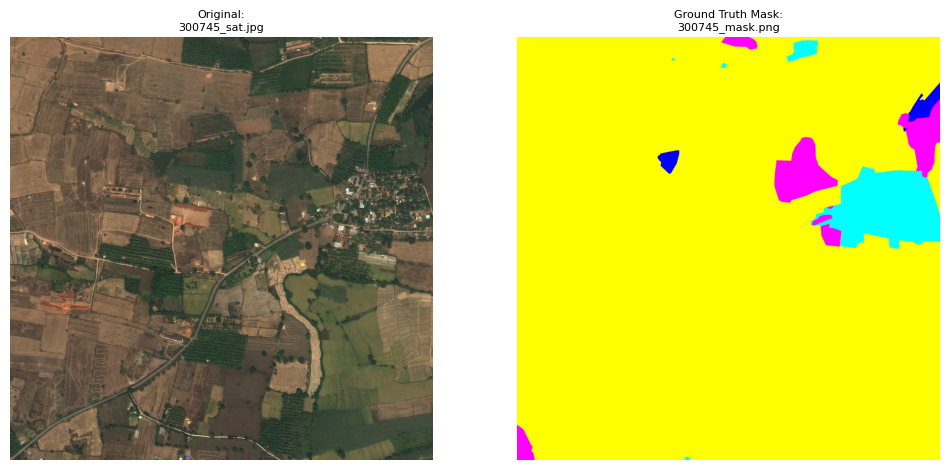

In [37]:
# Randomly selects image and mask from sample set and plot just to double check everything is working correctly.
# Run this a few times to check on a few different image and mask sets
sanity_check(abspath_curr + '/data/train/train_images/images/' , abspath_curr + '/data/train/train_masks/masks/')

Some examples of our training images and masks are shown below:

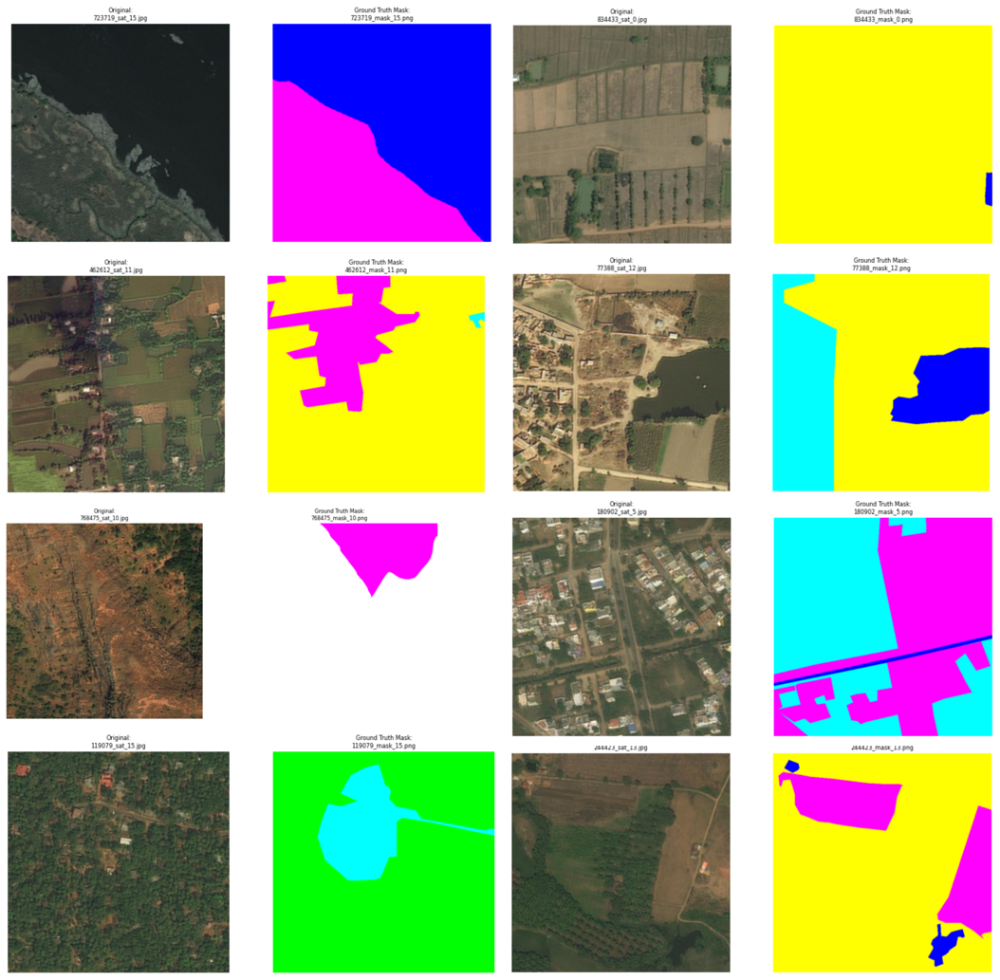

*Fig 6: Sample images and masks from training dataset*

#### **3.2) Set up generators, image preprocessing, and loading data to generators**

Part of the image preprocessing process is to one hot encode our labels where each class is represented by their own image channel like shown below in Figure 7.

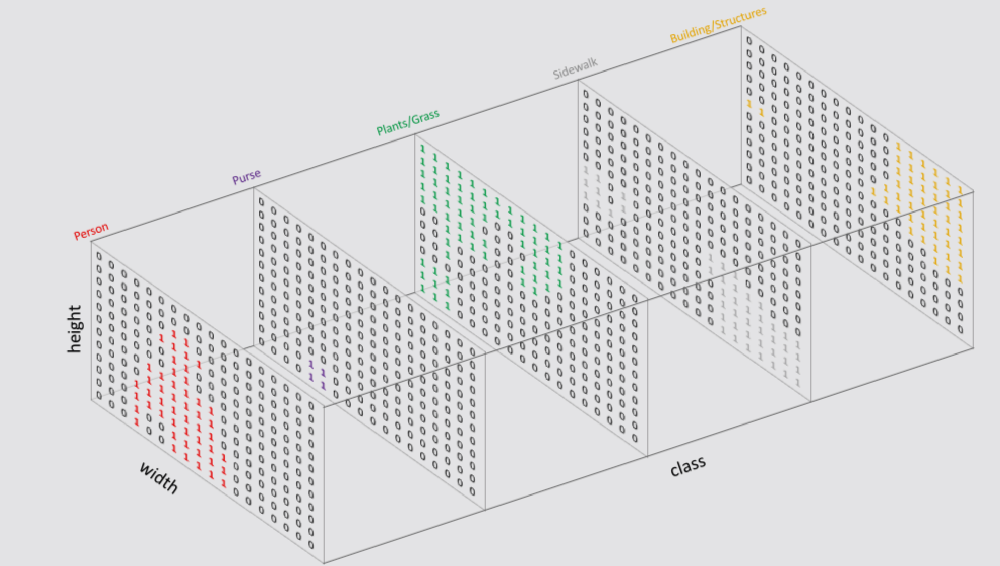

*Fig 7: One-hot encode for semantic image segmentation. [Source](https://www.jeremyjordan.me/semantic-segmentation/)*

In [39]:
def binarize(img, threshold=128):
  """
  Function to binarize images at some threshold pixel value
  
  Parameters:
    img: image in numpy matrix
    threshold: pixel threshold to binarize

  Return:
    img: binarized image in numpy matrix
  """
  # Binarize the image
  if np.max(img) > 1:
    img[img > threshold] = 255
    img[img <= threshold] = 0
  else:
    img[img > (threshold/255)] = 255
    img[img <= (threshold/255)] = 0    

  return img

In [40]:
def rescale(img):
  """
  Function to rescale image from 0 to 255 to between 0 and 1. 
  
  Parameters:
    img: image in numpy matrix

  Return:
    img: rescaled image in numpy matrix
  """
  if np.max(img) > 1:
    img = np.multiply(img, 1./255)

  return img

In [41]:
def one_hot_encode(img, class_map=None):
  """
  Function to one hot encode ground truth masks

  Parameters:
    img: mask image where each channel represents a color channel
    class_map: class_df

  Return:
    frame: one hot encoded image where each channel represents a class
  """

  if class_map is None:
    class_map = pd.DataFrame({'name':['urban_land','agriculture_land','rangeland','forest_land','water','barren_land','unknown'], 
                              'r':[0,255,255,0,0,255,0], 
                              'g':[255,255,0,255,0,255,0],
                              'b':[255,0,255,0,255,255,0]})

  img_copy = copy.deepcopy(img)
  frame = np.zeros((img.shape[0], img.shape[1], len(class_map))).astype('int')

  class_channel = 0

  for index, row in class_df.iterrows():
    new_img = copy.deepcopy(img_copy[::,::,::])

    R = new_img[::,::,0]
    G = new_img[::,::,1]
    B = new_img[::,::,2]

    # OHE each class type
    new_img[(R == row['r']/255) & (G == row['g']/255) & (B == row['b']/255)] = 2
    new_img[new_img < 2] = 0
    new_img[new_img == 2] = 1

    new_channel = copy.deepcopy(new_img[::,::,0])

    # Take first layer since they are all the same and put into OHE mask
    frame[::,::,class_channel] = new_channel

    class_channel+=1

  return frame


In [42]:
def reverse_one_hot_encode(img, class_map=None):
  """
  Function to reverse one hot encode 7 class channel to 3 channel RGB mask

  Parameters:
    img: image of one hot encoded mask image where each channel represents a class
    class_map: class_df

  Return:
    rgb_img: reversed one hot encoded image of RGB channels
  """

  if class_map is None:
    class_map = pd.DataFrame({'name':['urban_land','agriculture_land','rangeland','forest_land','water','barren_land','unknown'], 
                              'r':[0,255,255,0,0,255,0], 
                              'g':[255,255,0,255,0,255,0],
                              'b':[255,0,255,0,255,255,0]})
    
  img = binarize(img)
  
  all_red_channels = []
  all_green_channels = []
  all_blue_channels = []

  class_channel = 0

  for index, row in class_df.iterrows():

    current_class_channel = copy.deepcopy(img[::,::,class_channel])

    temp_rgb = np.zeros((img.shape[0], img.shape[1], 3))

    # if pixel value > 128 then put 0s in R, 255 in g, 255 in b
    # or corresponding RGB for each class

    if row['r'] > 0:
      temp_rgb[::,::,0] = current_class_channel
    if row['g'] > 0:
      temp_rgb[::,::,1] = current_class_channel
    if row['b'] > 0:
      temp_rgb[::,::,2] = current_class_channel

    all_red_channels.append(copy.deepcopy(temp_rgb[::,::,0]))
    all_green_channels.append(copy.deepcopy(temp_rgb[::,::,1]))
    all_blue_channels.append(copy.deepcopy(temp_rgb[::,::,2]))

    class_channel += 1

  red_stack = np.dstack(tuple(all_red_channels))
  green_stack = np.dstack(tuple(all_green_channels))
  blue_stack = np.dstack(tuple(all_blue_channels))

  rgb_img = np.zeros((img.shape[0], img.shape[1], 3))

  rgb_img[::,::,0] = np.max(red_stack, axis=2)
  rgb_img[::,::,1] = np.max(green_stack, axis=2)
  rgb_img[::,::,2] = np.max(blue_stack, axis=2)

  return rgb_img

In [43]:
def preprocessor_images(image, b_threshold=128):
  """
  Function to combine preprocessing steps to feed into ImageDataGenerator.
  'Masks' have to binarize then rescale. 'Images' just have to rescale.

  Parameters:
    image: image in numpy (x,y,3)
    b_threshold: binary threshold value for pixels, default at 128.

  Return:
    final_img: final image to return from preprocessor after going through 
              all processing steps.
  """
  final_img = rescale(image)

  return final_img

In [44]:
def preprocessor_masks(image, b_threshold=128, class_map=None):
  """
  Function to combine preprocessing steps to feed into ImageDataGenerator.
  'Masks' have to binarize then rescale. 'Images' just have to rescale.

  Parameters:
    image: image in numpy (x,y,3)
    class_map: mapping dataframe of classes and their corresponding RGB values for one hot encoding into separate channels
    b_threshold: binary threshold value for pixels, default at 128.

  Return:
    final_img: final image to return from preprocessor after going through 
              all processing steps.
  """
  image = one_hot_encode(image, class_map)
  final_img = rescale(image)

  return final_img

In [45]:
def data_generator(img_folder, mask_folder, batch_size, imsize, num_classes, first_n=None):
  """
  Function to create data generator object of images and masks.

  Parameters:
    img_folder: directory path to images folder
    mask_folder: directory path to masks folder
    batch_size: batch size to use 
    imsize: image height and width and n channels (image height, image width, n of channels)
    first_n: optional, set to some int to choose only first n data points

  Yields:
    (img, mask): tuple of image and mask in np arrays of shape (batch size, image height, image width, n of channels)
  """
  element_counter = 0 
  
  images_list = os.listdir(img_folder) #List of training images
  masks_list = os.listdir(mask_folder) #List of Mask images

  if first_n is None:
    images_list = sorted(images_list)
    masks_list= sorted(masks_list)
  else:
    images_list = sorted(images_list)[:first_n]
    masks_list= sorted(masks_list)[:first_n]
  
  while (True):
    channel_num = 3
    img = np.zeros((batch_size, imsize, imsize, channel_num)).astype('float')
    mask = np.zeros((batch_size, imsize, imsize, num_classes)).astype('int')

    for i in range(element_counter, min(element_counter+batch_size, len(images_list))):

    #for i in range(element_counter, element_counter+batch_size):

      # Read an image from folder and resize
      train_img = plt.imread(img_folder+'/'+images_list[i])
      train_img =  cv2.resize(train_img, (imsize, imsize))

      # Read corresponding mask from folder and resize
      train_mask = plt.imread(mask_folder+'/'+masks_list[i])
      train_mask = cv2.resize(train_mask, (imsize, imsize))

      #Add pre-processing steps
      train_img = preprocessor_images(train_img)
      train_mask = preprocessor_masks(train_mask)
      
      #add to array - img[0], img[1], and so on to created np framework
      mask[i-element_counter] = train_mask
      img[i-element_counter] = train_img 
    
    element_counter+=batch_size

    # If we've reached the end of the batch, set element_counter back to 0 to start next batch
    if(element_counter+batch_size>=len(images_list)):
      element_counter=0
    
    yield (img, mask)

In [46]:
# Set model metadata parameters
train_samples = 11568
val_samples = 1280
batch_size = 4
num_classes = 7
imsize = 612

In [47]:
# Create data generator objects for training and validation data for U-Net
train_gen = data_generator(img_folder = abspath_curr + '/data/train/train_images/images/',
                     mask_folder = abspath_curr + '/data/train/train_masks/masks/', 
                     batch_size = batch_size,
                     imsize = imsize,
                     num_classes = num_classes,
                     first_n = train_samples)

val_gen = data_generator(img_folder = abspath_curr + '/data/val/val_images/images/',
                   mask_folder = abspath_curr + '/data/val/val_masks/masks/', 
                   batch_size = batch_size,
                   imsize = imsize,
                   num_classes = num_classes,
                   first_n = val_samples)

In [49]:
for i, batch in enumerate(train_gen):
    print(f"Batch {i}: {batch}")
    if i >= 10:
        break

Batch 0: (array([[[[0.49803922, 0.41960784, 0.31372549],
         [0.50980392, 0.43529412, 0.32941176],
         [0.50196078, 0.42352941, 0.31764706],
         ...,
         [0.40784314, 0.3372549 , 0.24705882],
         [0.43137255, 0.37254902, 0.29019608],
         [0.41960784, 0.35686275, 0.2627451 ]],

        [[0.50588235, 0.43921569, 0.32941176],
         [0.51372549, 0.44705882, 0.3372549 ],
         [0.48627451, 0.41960784, 0.30980392],
         ...,
         [0.43137255, 0.36862745, 0.2745098 ],
         [0.43529412, 0.38431373, 0.29803922],
         [0.43137255, 0.36862745, 0.2745098 ]],

        [[0.49019608, 0.42352941, 0.30980392],
         [0.49411765, 0.43137255, 0.31764706],
         [0.49803922, 0.43137255, 0.31764706],
         ...,
         [0.43137255, 0.37254902, 0.27058824],
         [0.42745098, 0.38039216, 0.29019608],
         [0.42352941, 0.36078431, 0.26666667]],

        ...,

        [[0.6       , 0.51372549, 0.36862745],
         [0.61176471, 0.5254902 , 0

Batch 10: (array([[[[0.14117647, 0.18039216, 0.14509804],
         [0.12156863, 0.16862745, 0.13333333],
         [0.16862745, 0.22352941, 0.16078431],
         ...,
         [0.45882353, 0.39607843, 0.28235294],
         [0.49019608, 0.41568627, 0.29803922],
         [0.5254902 , 0.43921569, 0.30980392]],

        [[0.15294118, 0.19607843, 0.15686275],
         [0.16078431, 0.18039216, 0.14509804],
         [0.25098039, 0.2627451 , 0.20392157],
         ...,
         [0.51764706, 0.4627451 , 0.34901961],
         [0.49411765, 0.43529412, 0.30980392],
         [0.56470588, 0.49019608, 0.34901961]],

        [[0.12156863, 0.19215686, 0.14901961],
         [0.21960784, 0.23921569, 0.18431373],
         [0.32941176, 0.30980392, 0.22745098],
         ...,
         [0.41176471, 0.35294118, 0.23921569],
         [0.55294118, 0.48235294, 0.36078431],
         [0.57254902, 0.49803922, 0.36862745]],

        ...,

        [[0.50980392, 0.36862745, 0.23529412],
         [0.53333333, 0.38431373, 

In [48]:
# Create data generator objects for training and validation data for transfer learning
transfer_learning_model_input_size = (512, 512, 3)

train_gen_tl = data_generator(img_folder = abspath_curr + '/data/train/train_images/images/',
                     mask_folder = abspath_curr + '/data/train/train_masks/masks/', 
                     batch_size = 1,
                     imsize = transfer_learning_model_input_size[0],
                     num_classes = num_classes,
                     first_n = train_samples)

val_gen_tl = data_generator(img_folder = abspath_curr + '/data/val/val_images/images/',
                   mask_folder = abspath_curr + '/data/val/val_masks/masks/', 
                   batch_size = 1,
                   imsize = transfer_learning_model_input_size[0],
                   num_classes = num_classes,
                   first_n = val_samples)

## **4) Build Model(s)**

#### **4.1) U-Net Architecture**

As mentioned in the introduction, a U-Net is a particular implementation of a CNN that has historically performed well on image segmentation problems. 

The architecture is shaped like a 'U', hence its name, and is composed of an Encoding and Decoding structure to downsample and upsample images. It also utilizes skip connections between each downsampled and upsampled corresponding layers in order to keep localization of objects.

My specific implementation will add Batch Normalization layers in order to prevent exploding and vanishing gradient problems that may occur. It can also act as a small regularizer to prevent overfitting.

I also experimented with AvgPooling instead of MaxPooling, adding DropOut layers, and extending the number of layers but early testing results did not improve on the plain U-Net with Batch Normalization layers.

Important to note that I did not design this model from scratch. I took [sample boilerplate U-Net implementation](https://github.com/zizhaozhang/unet-tensorflow-keras/blob/master/model.py) from the community and adjusted it to suit my needs.

#### **4.2) Metrics, Loss, and Optimizer**


Metrics:
*   Our main metric to measure performance is [pixel-wise Dice Coefficient](https://towardsdatascience.com/dealing-with-class-imbalanced-image-datasets-1cbd17de76b5) which is a measure of overlap between two samples, in our case the groundtruth and the predicted masks, and is calculated as:

  $Eqn (1):$
  
  $Dice = \frac{2 |A∩B|}{|A| + |B|} = \frac{2TP}{2TP + FN + FP}$

    where A and B are the actual predicted masks' set of pixels. |A∩B| represents the common elements between A and B and |A| represents the common elements in A, and same in B. A Dice Coefficient of 0 is the worst and 1 is the best, or a perfect overlap.

*   We will also use Precision and Recall as secondary metrics to determine how well or bad our model is at classifying FP and FNs.

Loss:
* I initially tested the commonly used pixel-wise cross entropy loss but it did not perform that in early testing, likely due to how this loss evalues the class predictions for each pixel vector individually and then averages over all pixels where each pixel has equal weighted learning.

* I also tested adding a class weight to a custom pixel-wise cross entropy loss but that also did not perform as well in early testing and seemed to struggle converging as the loss would continually decrease then increase again.

* Instead, we will be using the pixel-wise Dice Coefficient as a loss which is calculated as 

  $Eqn (2):$
  
  $Dice Loss = 1-  Dice = 1- \frac{2 |A∩B|}{|A| + |B|} = 1-\frac{2TP}{2TP + FN + FP}$     

* The Dice Loss is more robust to class imbalances and edge detection than cross entropy. A sample illustration is shown in Figure 8 below.

Optimizer:
*   We will be using the [Adam optimization](https://keras.io/api/optimizers/adam/) which is a stochastic gradient descent method that is based on adaptive estimation of first-order and second-order moments. This has shown to be a good optimizer to use for image segmentation problems by the machine learning community.
*   Concretely, the Adam optimization method should allow us to be more handsoff in tuning the learning rate scheduling as it will automatically perform that operation. Additionally, it will adaptively select a separate learning rate for each parameter which can be extremely advantageous.
*   However, to be safe, we will set an overall initial learning rate of 1e-5 and add a learning rate scheduling decrease by a factor of 10 with a patience of 3 epochs.









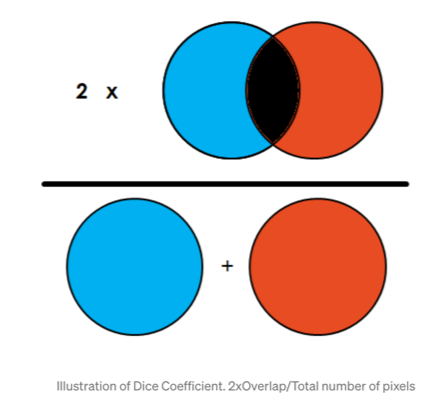

*Fig 8: Illustration of Dice Coefficient. [Source](https://towardsdatascience.com/metrics-to-evaluate-your-semantic-segmentation-model-6bcb99639aa2)*

#### **4.3) Model Implementation**

In [49]:
# Make directory
make_directory(abspath_curr + '/result/model/')

In [50]:
# Import keras and model specific objects
from tensorflow.keras import layers 
from tensorflow.keras.layers import Input , Conv2D , MaxPooling2D , Dropout , concatenate , UpSampling2D, Conv2DTranspose, Concatenate, BatchNormalization, Activation, MaxPool2D
from tensorflow.keras import models
from tensorflow.keras import losses
from tensorflow.keras import optimizers
from tensorflow.keras import backend as K
from tensorflow.keras.activations import softmax
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model

In [51]:
def softmax_axis(x):
  """
  Function to wrap Keras' Softmax activation function in order to deliver a value to the 'axis' parameter when defining model.

  Parameters:
    x: np array to perform Softmax on

  Return:
    softmax(x, axis=3): Ensures Softmax function is applied to the 3rd axis, depth along channels
  """
  return softmax(x, axis=3)

In [52]:
def get_crop_shape(target, refer):
  """
  Function to get new heights and widths to allow for cropping
  and ensure proper size to allow for U-Net model concatenation between 2 outputs of Conv blocks.
  This is part of the U-Net's skip connections.

  Parameters:
    target: target to crop
    refer: reference for crop

  Return:
    (ch1, ch2), (cw1, cw2): heights and widths of new sizes to allow for proper cropping and concatenation.
  """
  # width, the 3rd dimension
  cw = (target.shape[2] - refer.shape[2])
  assert (cw >= 0)
  if cw % 2 != 0:
      cw1, cw2 = int(cw/2), int(cw/2) + 1
  else:
      cw1, cw2 = int(cw/2), int(cw/2)

  # height, the 2nd dimension
  ch = (target.shape[1] - refer.shape[1])
  assert (ch >= 0)
  if ch % 2 != 0:
      ch1, ch2 = int(ch/2), int(ch/2) + 1
  else:
      ch1, ch2 = int(ch/2), int(ch/2)

  return (ch1, ch2), (cw1, cw2)

In [53]:

def unet(pretrained_weights = None, input_size = (612,612,3), num_classes=7):
  """
  Function to build U-Net network architecture. 
  See Figure 4 above for a visualization of the U-Net architecture.
  Used https://github.com/zizhaozhang/unet-tensorflow-keras/blob/master/model.py as template.

  Parameters:
    pretrained_weights: path to load pretrained weights if needed
    input_size: (height, width, channels) size of input images
    num_classes: number of channels/classes

  Return:
    model: Keras model of U-Net
  """
  keras.backend.clear_session()
  concat_axis = 3
  inputs = layers.Input(shape = input_size)

  conv1 = layers.Conv2D(64, (3, 3), padding='same', name='conv1_1')(inputs)
  conv1 = layers.BatchNormalization()(conv1)
  conv1 = layers.Activation('relu')(conv1)
  conv1 = layers.Conv2D(64, (3, 3), padding='same')(conv1)
  conv1 = layers.BatchNormalization()(conv1)
  conv1 = layers.Activation('relu')(conv1)
  pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)
  pool1 = layers.BatchNormalization()(pool1)

  conv2 = layers.Conv2D(128, (3, 3), padding='same')(pool1)
  conv2 = layers.BatchNormalization()(conv2)
  conv2 = layers.Activation('relu')(conv2)
  conv2 = layers.Conv2D(128, (3, 3), padding='same')(conv2)
  conv2 = layers.BatchNormalization()(conv2)
  conv2 = layers.Activation('relu')(conv2)
  pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)
  pool2 = layers.BatchNormalization()(pool2)

  conv3 = layers.Conv2D(256, (3, 3), padding='same')(pool2)
  conv3 = layers.BatchNormalization()(conv3)
  conv3 = layers.Activation('relu')(conv3)
  conv3 = layers.Conv2D(256, (3, 3), padding='same')(conv3)
  conv3 = layers.BatchNormalization()(conv3)
  conv3 = layers.Activation('relu')(conv3)
  pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)
  pool3 = layers.BatchNormalization()(pool3)

  conv4 = layers.Conv2D(512, (3, 3), padding='same')(pool3)
  conv4 = layers.BatchNormalization()(conv4)
  conv4 = layers.Activation('relu')(conv4)
  conv4 = layers.Conv2D(512, (3, 3), padding='same')(conv4)
  conv4 = layers.BatchNormalization()(conv4)
  conv4 = layers.Activation('relu')(conv4)
  pool4 = layers.MaxPooling2D(pool_size=(2, 2))(conv4)
  pool4 = layers.BatchNormalization()(pool4)

  conv5 = layers.Conv2D(1024, (3, 3), padding='same')(pool4)
  conv5 = layers.BatchNormalization()(conv5)
  conv5 = layers.Activation('relu')(conv5)
  conv5 = layers.Conv2D(1024, (3, 3), padding='same')(conv5)
  conv5 = layers.BatchNormalization()(conv5)
  conv5 = layers.Activation('relu')(conv5)

  up_conv5 = layers.UpSampling2D(size=(2, 2))(conv5)
  up_conv5 = layers.BatchNormalization()(up_conv5)
  ch, cw = get_crop_shape(conv4, up_conv5)
  crop_conv4 = layers.Cropping2D(cropping=(ch,cw))(conv4)
  up6 = layers.concatenate([up_conv5, crop_conv4], axis=concat_axis)
  conv6 = layers.Conv2D(512, (3, 3), padding='same')(up6)
  conv6 = layers.BatchNormalization()(conv6)
  conv6 = layers.Activation('relu')(conv6)
  conv6 = layers.Conv2D(512, (3, 3), padding='same')(conv6)
  conv6 = layers.BatchNormalization()(conv6)
  conv6 = layers.Activation('relu')(conv6)

  up_conv6 = layers.UpSampling2D(size=(2, 2))(conv6)
  up_conv6 = layers.BatchNormalization()(up_conv6)
  ch, cw = get_crop_shape(conv3, up_conv6)
  crop_conv3 = layers.Cropping2D(cropping=(ch,cw))(conv3)
  #crop_conv3 = layers.Cropping2D(cropping=((1, 0), (1, 0)))(crop_conv3)
  up7 = layers.concatenate([up_conv6, crop_conv3], axis=concat_axis) 
  conv7 = layers.Conv2D(256, (3, 3), padding='same')(up7)
  conv7 = layers.BatchNormalization()(conv7)
  conv7 = layers.Activation('relu')(conv7)
  conv7 = layers.Conv2D(256, (3, 3), padding='same')(conv7)
  conv7 = layers.BatchNormalization()(conv7)
  conv7 = layers.Activation('relu')(conv7)

  up_conv7 = layers.UpSampling2D(size=(2, 2))(conv7)
  up_conv7 = layers.BatchNormalization()(up_conv7)
  ch, cw = get_crop_shape(conv2, up_conv7)
  crop_conv2 = layers.Cropping2D(cropping=(ch,cw))(conv2)
  up8 = layers.concatenate([up_conv7, crop_conv2], axis=concat_axis)
  conv8 = layers.Conv2D(128, (3, 3), padding='same')(up8)
  conv8 = layers.BatchNormalization()(conv8)
  conv8 = layers.Activation('relu')(conv8)
  conv8 = layers.Conv2D(128, (3, 3), padding='same')(conv8)
  conv8 = layers.BatchNormalization()(conv8)
  conv8 = layers.Activation('relu')(conv8)

  up_conv8 = layers.UpSampling2D(size=(2, 2))(conv8)
  up_conv8 = layers.BatchNormalization()(up_conv8)
  ch, cw = get_crop_shape(conv1, up_conv8)
  crop_conv1 = layers.Cropping2D(cropping=(ch,cw))(conv1)
  up9 = layers.concatenate([up_conv8, crop_conv1], axis=concat_axis)
  conv9 = layers.Conv2D(64, (3, 3), padding='same')(up9)
  conv9 = layers.BatchNormalization()(conv9)
  conv9 = layers.Activation('relu')(conv9)
  conv9 = layers.Conv2D(64, (3, 3), padding='same')(conv9)
  conv9 = layers.BatchNormalization()(conv9)
  conv9 = layers.Activation('relu')(conv9)

  ch, cw = get_crop_shape(inputs, conv9)
  conv9 = layers.ZeroPadding2D(padding=((ch[0], ch[1]), (cw[0], cw[1])))(conv9)
  
  outputs = layers.Conv2D(num_classes, (1, 1), activation=softmax_axis,  padding='same')(conv9)
  
  model = models.Model(inputs=inputs, outputs=outputs, name='U-Net')
  if(pretrained_weights):
    model.load_weights(pretrained_weights)

  model.save('my_model.keras')
  return model

In [54]:
def dice_coef(y_true, y_pred, smooth=1):
    """
    Function to calculate Dice Coefficient 

    Parameters:
      y_true: True label
      y_pred: Predicted label
      smooth: Apply a smoothness hyperparameter value

    Return:
      Dice Coefficient

    Dice = (2*|X & Y|)/ (|X|+ |Y|)
         =  2*sum(|A*B|)/(sum(A^2)+sum(B^2))
    ref: https://arxiv.org/pdf/1606.04797v1.pdf
    """
    y_pred = tf.cast(y_pred, dtype=tf.float32)
    y_true = tf.cast(y_true, dtype=tf.float32)
    
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    return (2. * intersection + smooth) / (K.sum(K.square(y_true),-1) + K.sum(K.square(y_pred),-1) + smooth)

def dice_coef_loss(y_true, y_pred):
    """
    Function to return 1-Dice Coeff as the loss

    Parameters:
      y_true: True label
      y_pred: Predicted label

    Return:
      Dice Coefficient Loss
    """
    return 1-dice_coef(y_true, y_pred)

In [55]:
# Attempt at using class weighted pixel-wise cross entropy but did not yield good convergence and therefore results
weights = class_pixels['True Weights'].tolist()

def weighted_pixelwise_crossentropy(class_weights):
    
  def loss(y_true, y_pred):
    y_pred = tf.cast(y_pred, dtype=tf.float32)
    y_true = tf.cast(y_true, dtype=tf.float32)
    # epsilon = _to_tensor(_EPSILON, y_pred.dtype.base_dtype)
    epsilon = K.epsilon()
    y_pred = tf.clip_by_value(y_pred, epsilon, 1. - epsilon)
    return - tf.reduce_sum(tf.math.multiply(y_true * tf.math.log(y_pred), class_weights))

  return loss

loss = weighted_pixelwise_crossentropy(weights)

In [56]:
# Load pretrained model
model = unet(input_size = (imsize,imsize,3), num_classes = num_classes)

opt = tf.keras.optimizers.Adam(learning_rate= 1e-5)
model.compile(optimizer=opt, loss=dice_coef_loss, metrics=[dice_coef, tf.keras.metrics.MeanIoU(num_classes=num_classes), tf.keras.metrics.Recall(), tf.keras.metrics.Precision()])

model.summary()

Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 612, 612, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_1 (Conv2D)               (None, 612, 612, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 612, 612, 64  256        ['conv1_1[0][0]']                
 alization)                     )                                                             

In [57]:
import backbones_unet

print(backbones_unet.__available_models__)

['convnext_atto', 'convnext_atto_ols', 'convnext_base', 'convnext_base_384_in22ft1k', 'convnext_base_in22ft1k', 'convnext_base_in22k', 'convnext_femto', 'convnext_femto_ols', 'convnext_large', 'convnext_large_384_in22ft1k', 'convnext_large_in22ft1k', 'convnext_large_in22k', 'convnext_nano', 'convnext_nano_ols', 'convnext_pico', 'convnext_pico_ols', 'convnext_small', 'convnext_small_384_in22ft1k', 'convnext_small_in22ft1k', 'convnext_small_in22k', 'convnext_tiny', 'convnext_tiny_384_in22ft1k', 'convnext_tiny_hnf', 'convnext_tiny_in22ft1k', 'convnext_tiny_in22k', 'convnext_xlarge_384_in22ft1k', 'convnext_xlarge_in22ft1k', 'convnext_xlarge_in22k', 'cs3darknet_focus_l', 'cs3darknet_focus_m', 'cs3darknet_l', 'cs3darknet_m', 'cs3darknet_x', 'cs3edgenet_x', 'cs3se_edgenet_x', 'cs3sedarknet_l', 'cs3sedarknet_x', 'cspdarknet53', 'cspresnet50', 'cspresnext50', 'darknet53', 'darknetaa53', 'densenet121', 'densenet161', 'densenet169', 'densenet201', 'densenetblur121d', 'dm_nfnet_f0', 'dm_nfnet_f1',

In [58]:
# ModelCheckpoint callback
model_checkpoint_cb = keras.callbacks.ModelCheckpoint(filepath=abspath_curr + '/result/model/new_model.weights.h5',
                                                      save_best_only=True,
                                                      save_weights_only=True)

# EarlyStopping callback
early_stopping_cb = keras.callbacks.EarlyStopping(patience=4,
                                                  restore_best_weights=True)

# ReduceLROnPlateau callback
reduce_lr_on_plateau_cb = keras.callbacks.ReduceLROnPlateau(
    factor=0.1,
    patience=3)

#### **4.4) Model Training**

In [59]:
history = model.fit(train_gen,
                    epochs = 10,
                    initial_epoch = 6,
                    steps_per_epoch = train_samples//batch_size,
                    validation_data = val_gen,
                    validation_steps = val_samples//batch_size,
                    verbose=1,
                    batch_size=batch_size,
                    callbacks=[model_checkpoint_cb, early_stopping_cb, reduce_lr_on_plateau_cb]
                    )

Epoch 7/10


: 

#### **4.5) Transfer Learning**

I looked into the [segmentation pretrained models](https://tfhub.dev/s?module-type=image-segmentation) to try and find a suitable pretrained model for our task. However, I was not able to get anyone of those models to work with our input and output sizes without a lot of additional data preprocessing. Additionally, I was unsure how to change the top layers of these pretrained models as the loaded models seem to be just an object without functionality to pick and choose which layers to remove. The documentation was sparse and I was not able to figure it out in the amount of time I devoted to it.

Instead, I will now try to use ResNet50 pretrained on ImageNet as our encoder block of our U-Net. This is a model and method of implementation that I am much more comfortable with.

The following ResNet50 backbone for the U-Net architecture is inspired from [this Github source](https://github.com/nikhilroxtomar/Semantic-Segmentation-Architecture/blob/main/TensorFlow/resnet50_unet.py). 

I initially tried a multitude of combinations to unfreeze the top n layers without much performance and validation success. I tried freezing all layers, then unfreezing top 50, then top 75, then top 125 layers with reduced learning rates. I did a combined total training of 50 Epochs and each combination still did not yield good results.

Interestingly, the results did improve with the deeper I unfroze the ResNet50 backbone layers. Therefore, I tried to just unfreeze the entire ResNet50 layer with the pretrained ImageNet weights and trained that for 30 Epochs. The results were much better as shown below.

In [ ]:
def conv_block(input, num_filters):
  '''
  A convolutional block
  '''
  x = Conv2D(num_filters, 3, padding="same")(input)
  x = BatchNormalization()(x)
  x = Activation("relu")(x)

  x = Conv2D(num_filters, 3, padding="same")(x)
  x = BatchNormalization()(x)
  x = Activation("relu")(x)

  return x

def decoder_block(input, skip_features, num_filters):
  '''
  A decoder block
  '''
  x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
  x = Concatenate()([x, skip_features])
  x = conv_block(x, num_filters)
  return x

def build_resnet50_unet(input_shape, freeze_all_layers=False, fine_tune_at=None, pretrained_weights = None):
  '''
  Build a U-Net architecture using ResNet50 as the backbone pretrained on ImageNet 
  '''
  keras.backend.clear_session()
  # Input 
  inputs = Input(input_shape)

  # Pre-trained ResNet50 Model 
  resnet50 = ResNet50(include_top=False, weights="imagenet", input_tensor=inputs)

  # Encoder 
  s1 = resnet50.get_layer(index=0).output           ## (512 x 512)
  s2 = resnet50.get_layer("conv1_relu").output        ## (256 x 256)
  s3 = resnet50.get_layer("conv2_block3_out").output  ## (128 x 128)
  s4 = resnet50.get_layer("conv3_block4_out").output  ## (64 x 64)

  # Bridge 
  b1 = resnet50.get_layer("conv4_block6_out").output  ## (32 x 32)

  # Decoder 
  d1 = decoder_block(b1, s4, 512)                     ## (64 x 64)
  d2 = decoder_block(d1, s3, 256)                     ## (128 x 128)
  d3 = decoder_block(d2, s2, 128)                     ## (256 x 256)
  d4 = decoder_block(d3, s1, 64)                      ## (512 x 512)

  # Output 
  outputs = keras.layers.Conv2D(num_classes, (1, 1), activation=softmax_axis,  padding='same')(d4)

  model = Model(inputs, outputs, name="ResNet50_U-Net")

  if(pretrained_weights):
    model.load_weights(pretrained_weights)
  
  if freeze_all_layers:
    # For each layer in the pretrained model
    for layer in resnet50.layers:
      # Freeze the layer
      layer.trainable = False
  else:
    # For each layer in the pretrained model
    for layer in resnet50.layers:
      # Freeze the layer
      layer.trainable = True
  
  if fine_tune_at is not None:
    # For each layer in the pretrained model
    for layer in resnet50.layers[fine_tune_at:]:
        # Unfreeze the layer
        layer.trainable = True
  
  return model, resnet50


In [ ]:
model2, pretrained_model = build_resnet50_unet(pretrained_weights = abspath_curr + '/result/model/transfer_learning_modelv3_epoch8_18.h5', input_shape = transfer_learning_model_input_size, freeze_all_layers=False)
model2.summary()

FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = 'C:/Users/aswin/Downloads/Compressed/satellite_image_segmentation-main/satellite_image_segmentation-main/result/model/transfer_learning_modelv3_epoch8_18.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [ ]:
opt = tf.keras.optimizers.Adam(lr = 1e-5)

model2.compile(
  optimizer=opt,
  loss=dice_coef_loss,
  metrics=[dice_coef, tf.keras.metrics.MeanIoU(num_classes=num_classes), tf.keras.metrics.Recall(), tf.keras.metrics.Precision()])

ValueError: Argument(s) not recognized: {'lr': 1e-05}

In [ ]:
history2 = model2.fit(train_gen_tl,
                    epochs = 21,
                    initial_epoch = 18,
                    steps_per_epoch = train_samples//batch_size,
                    validation_data = val_gen_tl,
                    validation_steps = val_samples//batch_size,
                    verbose=1,
                    batch_size=batch_size,
                    callbacks=[model_checkpoint_cb, early_stopping_cb, reduce_lr_on_plateau_cb])


make_directory(abspath_curr + '/result/figure/')
history_df = pd.DataFrame(history2.history)
history_df.to_csv(abspath_curr + '/result/figure/history_transferlearningmodelv3_ep18_21.csv', index=False)

## **5) Validation Results**

#### **5.1) Learning Curves**

Let's take a look at how our metrics change as we increase training time for our ResNet50 backboned with U-Net decoder model.

In [ ]:
read_from_csv = True
history_file = abspath_curr + '/result/figure/history_transferlearningmodelv3.csv'
                 
make_directory(abspath_curr + '/result/figure/')

# Load history_df, concat to history
if read_from_csv:
  history_df_loaded = pd.read_csv(history_file)
  # history_df_loaded2 = pd.read_csv(history_file2)
  history_df = history_df_loaded.copy()
  # history_df2 = history_df_loaded2.copy()
  # history_df = pd.concat([history_df_loaded, history_df_loaded2], axis=0)
  # history_df.reset_index(drop=True, inplace=True)
else:
  history_df = pd.DataFrame(history.history)
  history_df

# Create a figure
# Save and show the figure
fig, axs = plt.subplots(5, figsize=(8,24))

axs[0].plot(history_df.index + 1, history_df['loss'], label='Training Dice Loss')
axs[0].plot(history_df.index + 1, history_df['val_loss'], label='Val. Dice Loss')
axs[0].legend(loc="upper right")
axs[0].set_title('Loss')
axs[0].set_xlabel('End of Epoch')

axs[1].plot(history_df.index + 1, history_df['dice_coef'], label='Pixelwise Dice Coef.')
axs[1].plot(history_df.index + 1, history_df['val_dice_coef'], label='Val. Pixelwise Dice Coef.')
axs[1].legend(loc="upper right")
axs[1].set_title('Dice Coefficient')
axs[1].set_xlabel('End of Epoch')

axs[2].plot(history_df.index + 1, history_df['recall'], label='Pixelwise Recall')
axs[2].plot(history_df.index + 1, history_df['val_recall'], label='Val. Pixelwise Recall')
axs[2].legend(loc="upper right")
axs[2].set_title('Recall')
axs[2].set_xlabel('End of Epoch')

axs[3].plot(history_df.index + 1, history_df['precision'], label='Pixelwise Precision')
axs[3].plot(history_df.index + 1, history_df['val_precision'], label='Val. Pixelwise Precision')
axs[3].legend(loc="upper right")
axs[3].set_title('Precision')
axs[3].set_xlabel('End of Epoch')

axs[4].plot(history_df.index + 1, history_df['lr'], label='Learning Rate')
axs[4].legend(loc="upper right")
axs[4].set_title('Learning Rate')
axs[4].set_xlabel('End of Epoch')

plt.tight_layout()
plt.savefig(abspath_curr + '/result/figure/learning_curve_model_v3.pdf')

history_df.to_csv(abspath_curr + '/result/figure/history_data_model_v3.csv', index=False)
# print(history_df)
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'C:/Users/aswin/Downloads/Compressed/satellite_image_segmentation-main/satellite_image_segmentation-main/result/figure/history_transferlearningmodelv3.csv'

*Fig 9: Model loss, performance metrics, and learning rate curves.*

#### **5.2) Optimal Model Validation Results**

From the validation curves above in Figure 9, it shows that generally the model's performance of the ResNet50 backbone with a U-Net decoder is optimal at Epoch 18 with a generally good balance between highest validation dice loss, precision, and recall. That is the final model and the one that we will use for testing purposes.


Validation Metric                     | Value 
--------------------------------------|------------------
Pixelwise Dice Coefficient Loss       | 0.197
Pixelwise Dice Coefficient            | 0.803
Pixelwise Precision                   | 0.644
Pixelwise Recall                      | 0.734
*Fig 10: ResNet50 backbone with U-Net decoder (trained to Epoch 18)'s scores*




#### **5.3) U-Net Only Architecture Validation Results**

Run this cell below multiple times to visually inspect random validation dataset and the model's predicted masks. The predicted masks will show the overall prediction and the prediction per channel.

ValueError: Input 0 of layer "U-Net" is incompatible with the layer: expected shape=(None, 612, 612, 3), found shape=(1, 2448, 2448, 3)

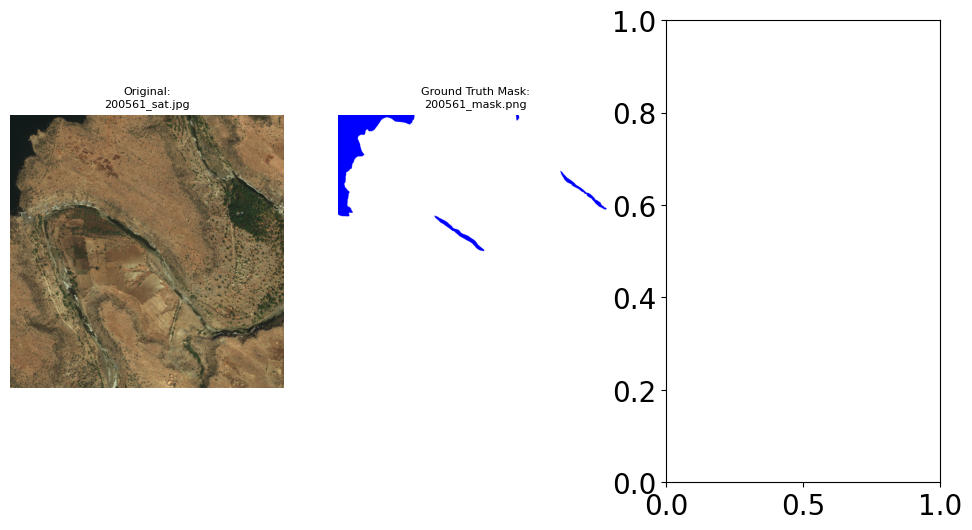

In [ ]:
# Randomly select validation image and mask then predict and plot prediction.
# Run this a few times to check on a few different image and mask sets
sanity_check(abspath_curr + '/data/val/val_images/images/' , abspath_curr + '/data/val/val_masks/masks/', predict=True, model=model, predicted_breakdown=True)

In some cases, our model does quite well.

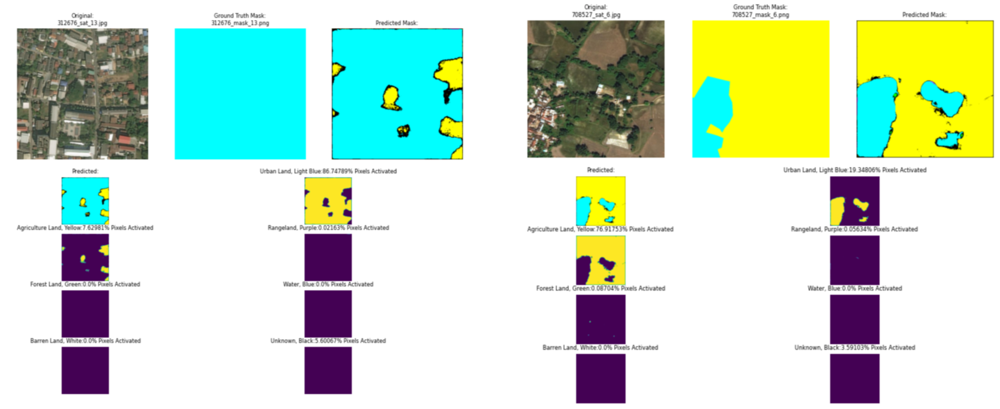

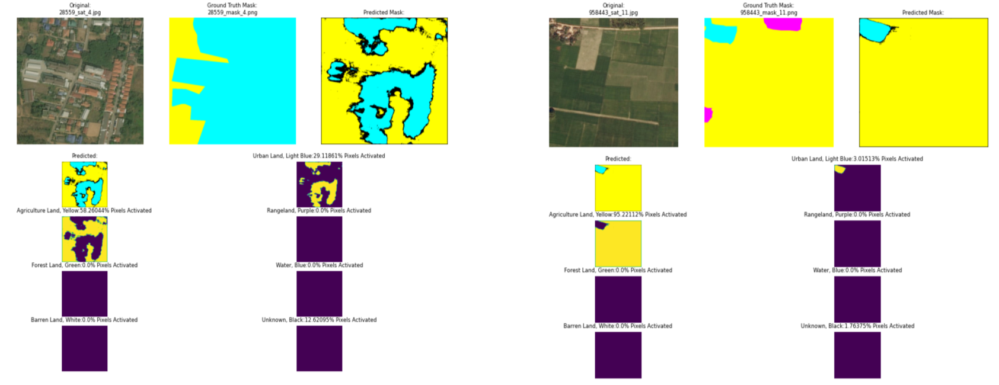

In other cases, not so much.

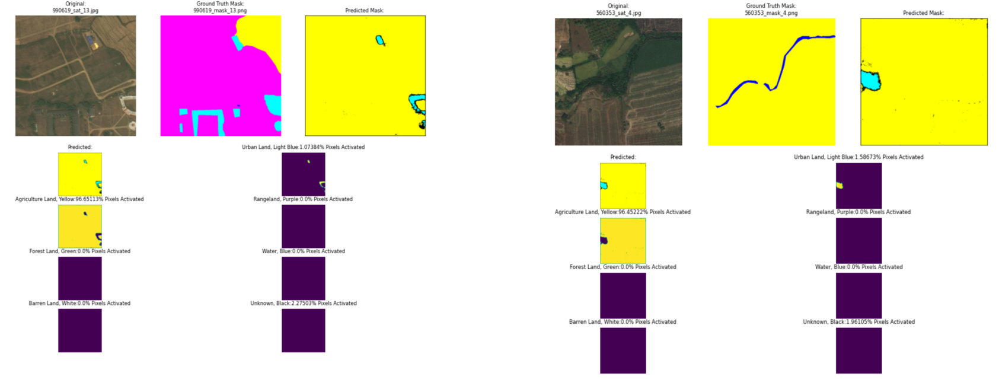

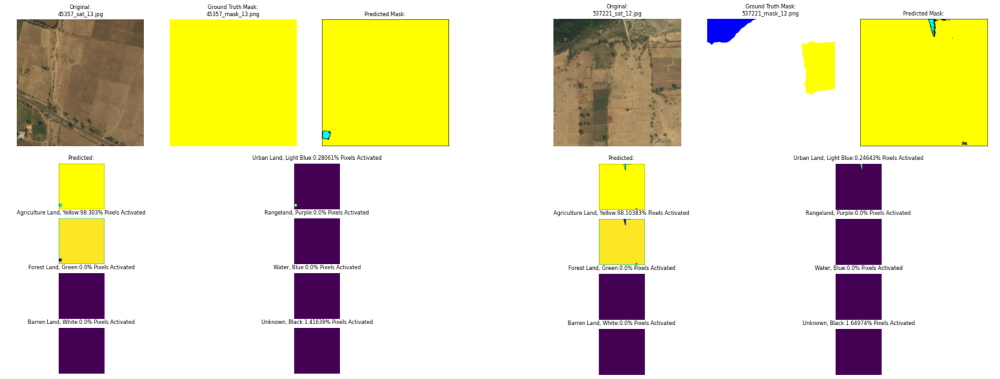

In some cases, our model can classify some forest (green) areas but struggles with water (dark blue).

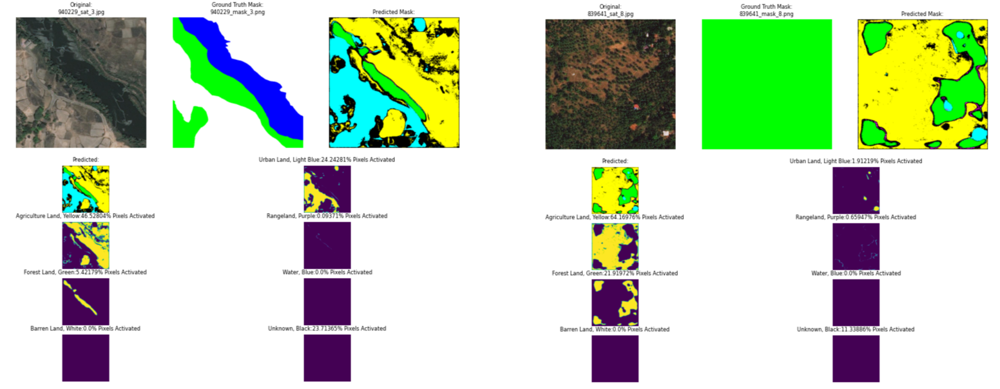

Our model can occasionally miss-classify urban areas (light blue) where there is none.

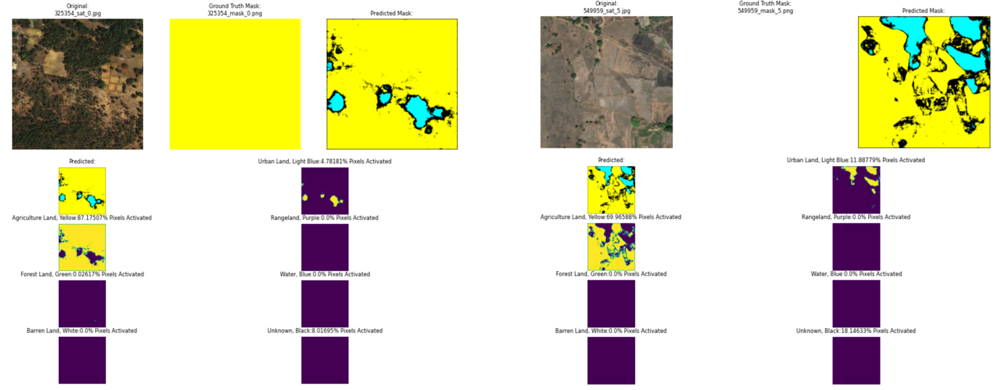

In other instances, it does quite well with urban areas (light blue).

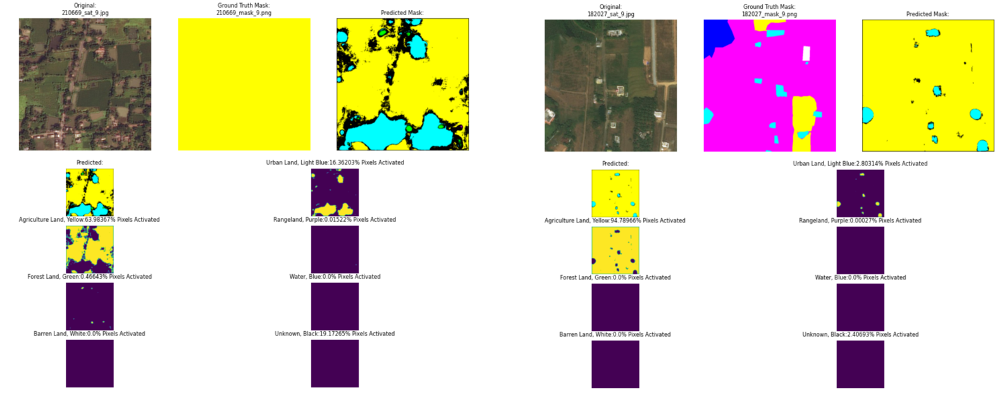

Interestingly, our model seems to learn roads as urban (light blue) or unknown (black) classes which were not marked in the Ground Truth masks.

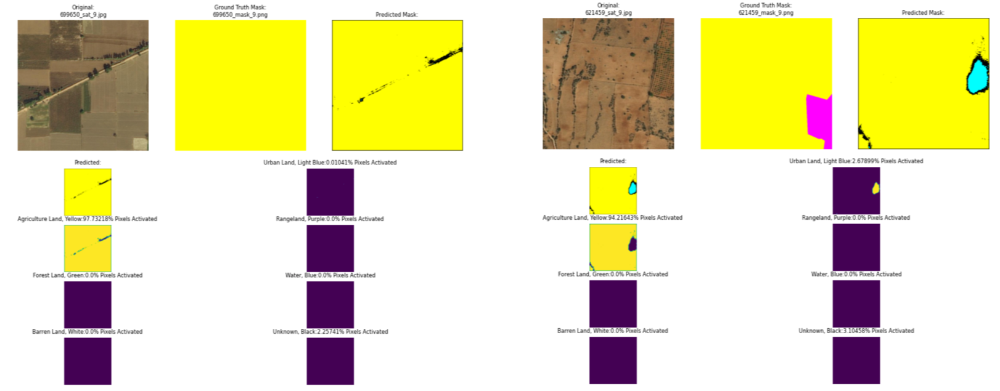

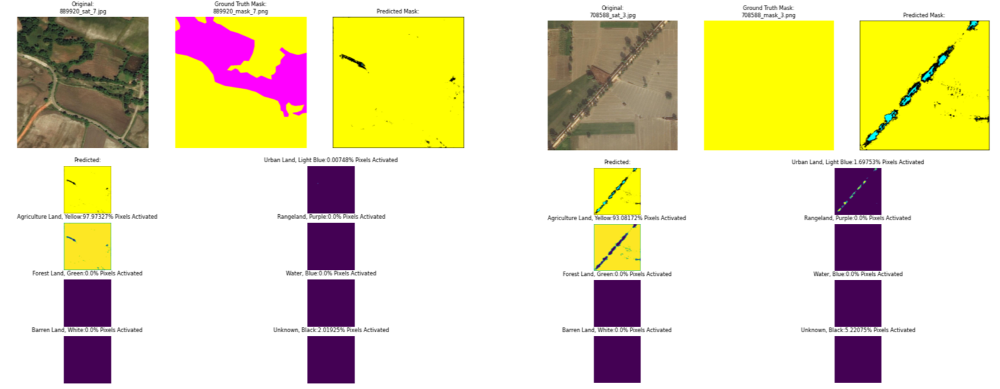

*Fig 11: Sample predictions vs. ground truth masks in validation data for U-Net only architecture*

#### **5.4) ResNet50_U-Net Architecture Results**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


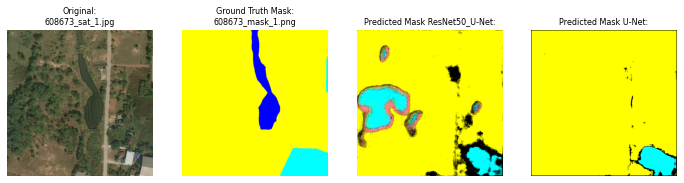

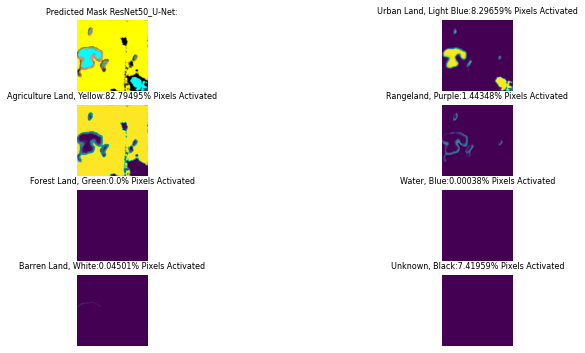

In [ ]:
# Randomly select validation image and mask then predict and plot prediction.
# Run this a few times to check on a few different image and mask sets
sanity_check(abspath_curr + '/data/val/val_images/images/' , abspath_curr + '/data/val/val_masks/masks/', predict=True, model=model2, model_alt=model, predicted_breakdown=True, imsize=transfer_learning_model_input_size[0], imsize_alt=imsize)

Generally speaking from the results, the ResNet50_U-Net model is able to 'see' other classes beyond argriculture and urban areas more than the U-Net only model.

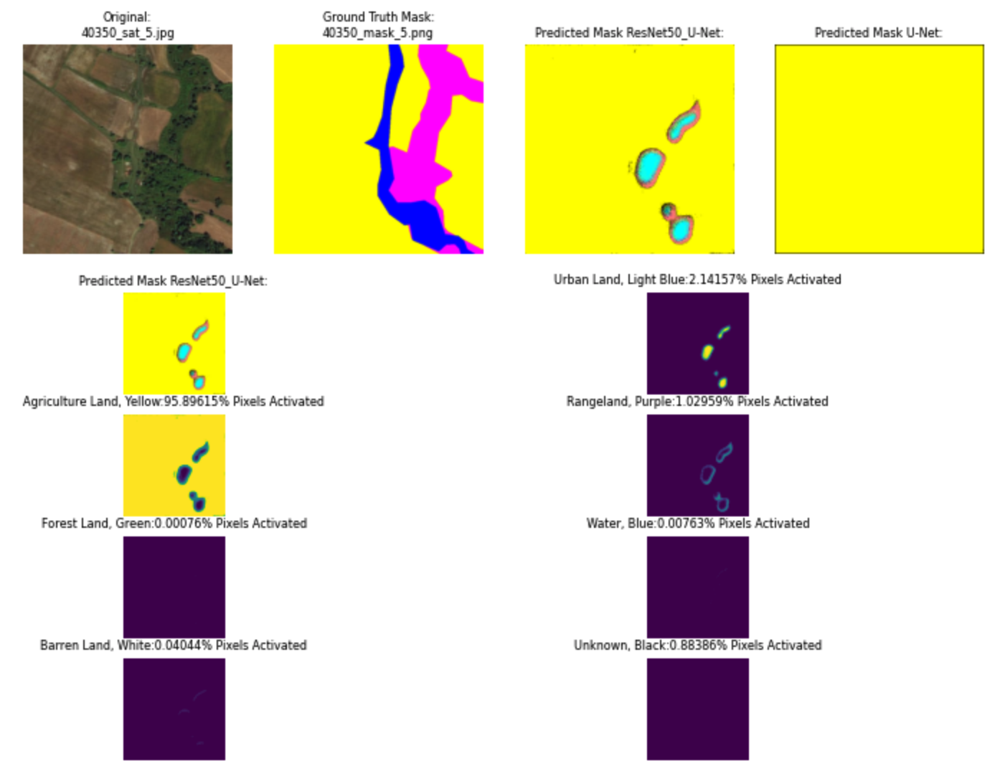

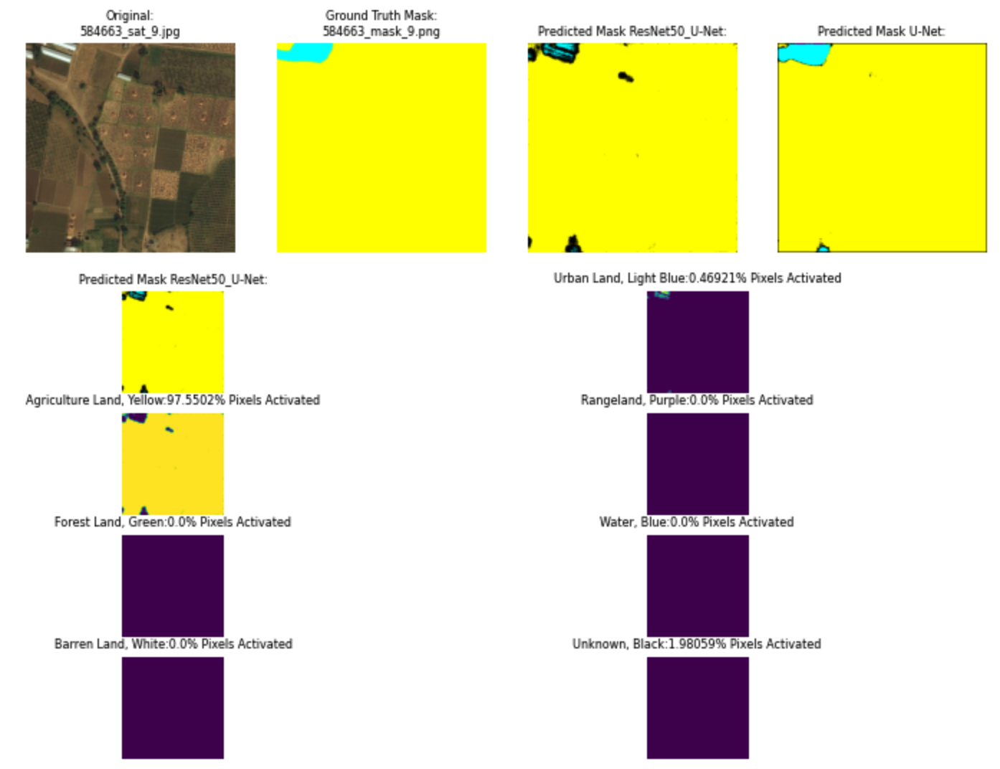

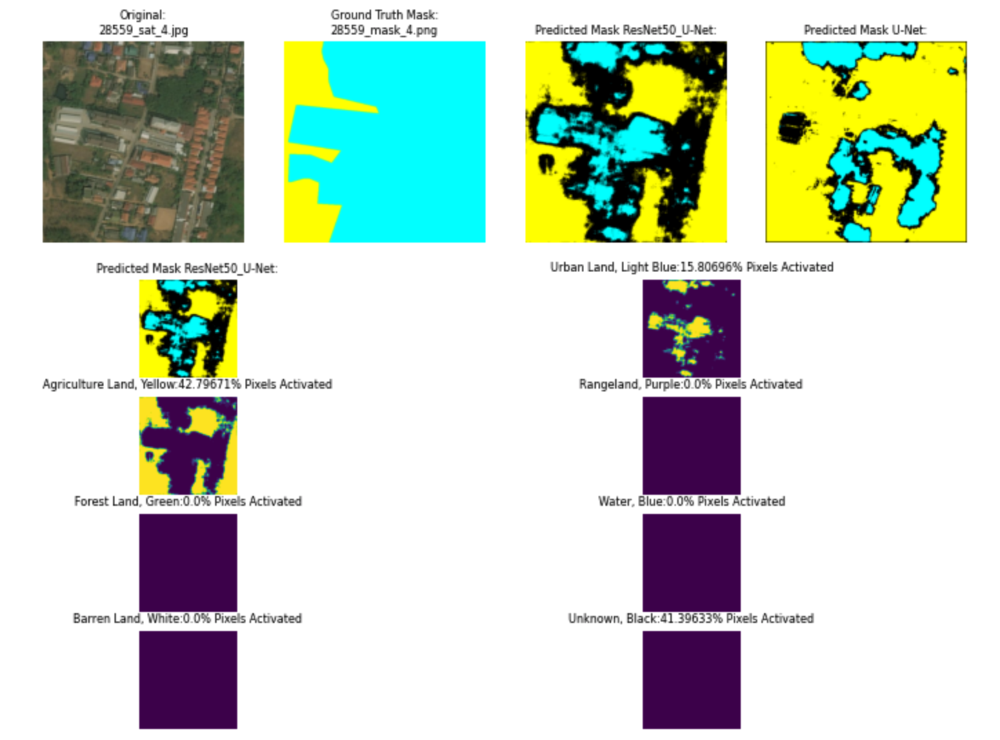

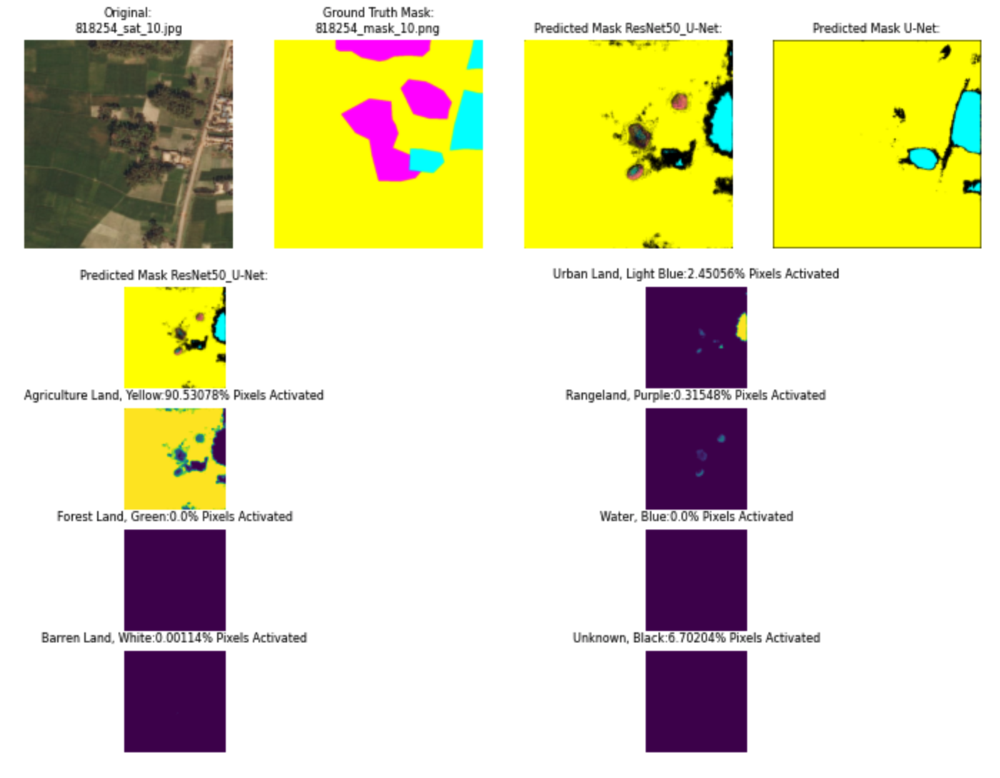

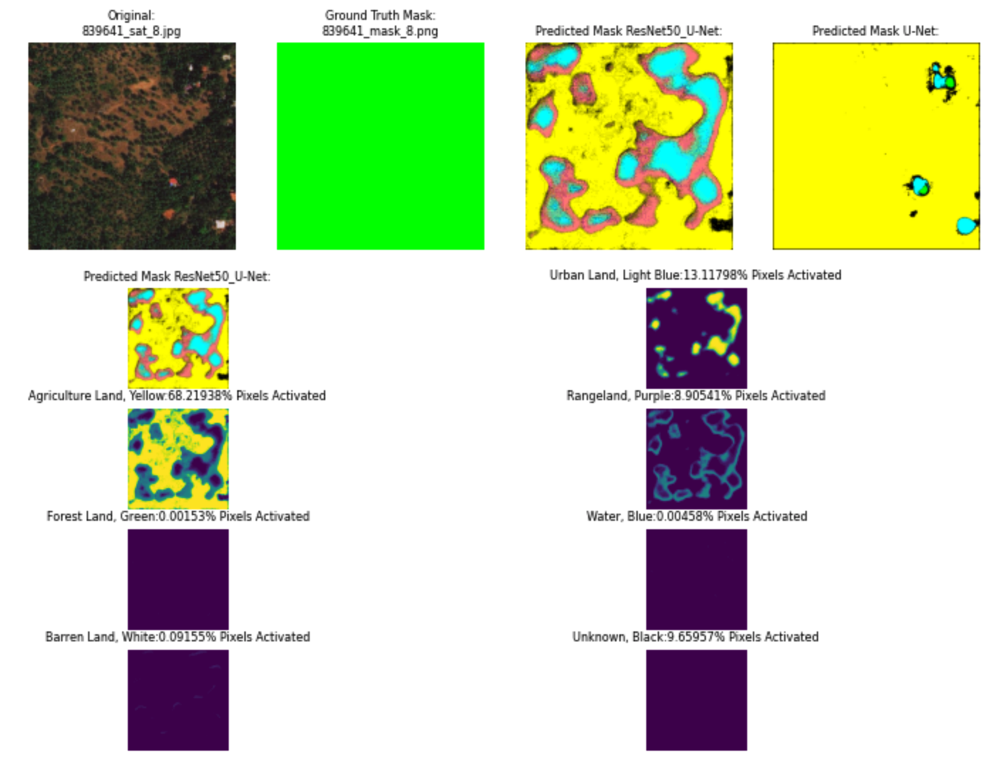

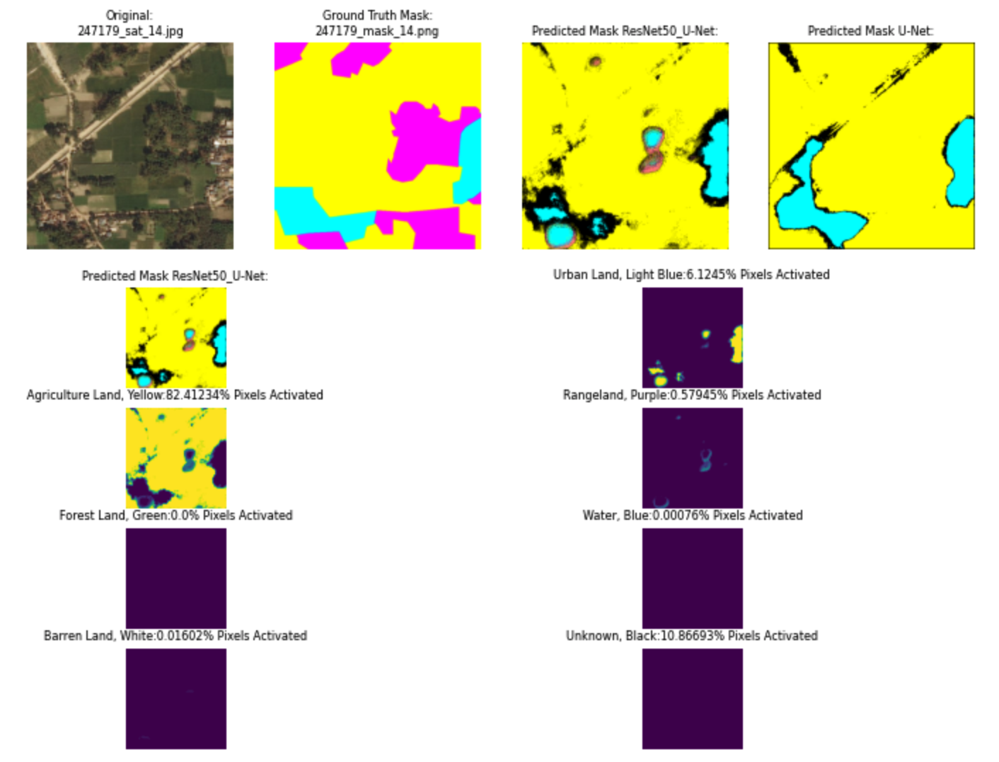

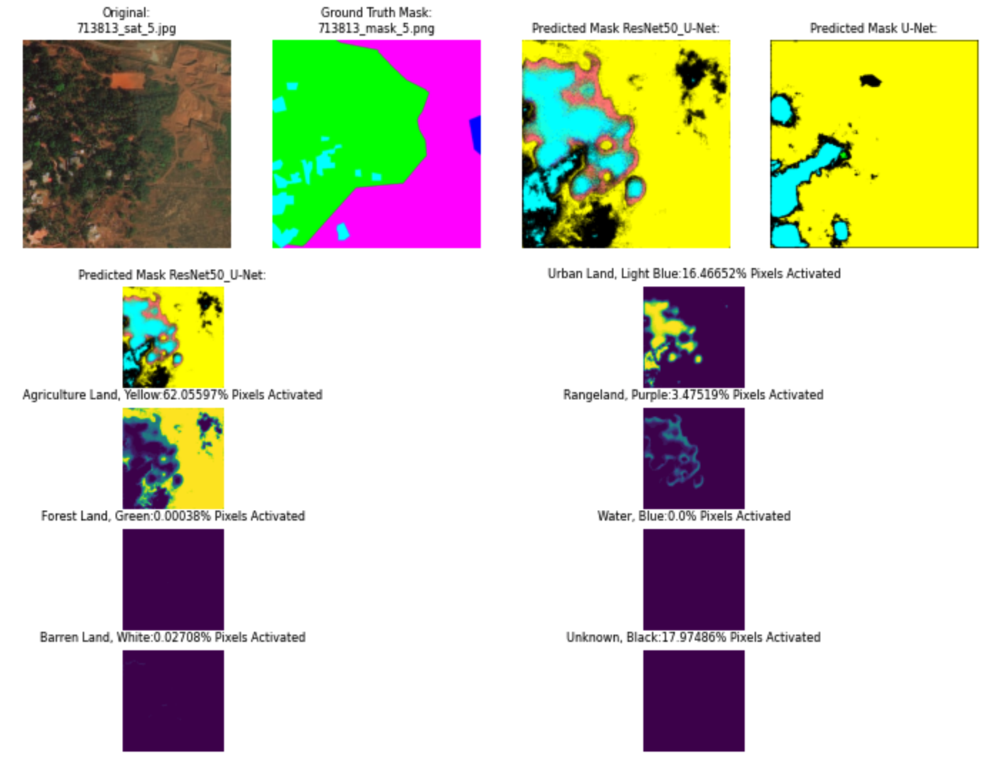

*Fig 12: Sample predictions vs. ground truth masks in validation data for ResNet50_U-Net architecture vs U-Net only architecture*

## **6) Test Data**

Now let's test our model on the testing dataset. Important to remember that our testing dataset does not have ground truth masks and is a dataset our model has never seen before even in validation.

#### **6.1) ResNet50_U-Net Architecture Test Results**


Run this cell below multiple times to visually inspect random testing dataset and the model's predicted masks.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


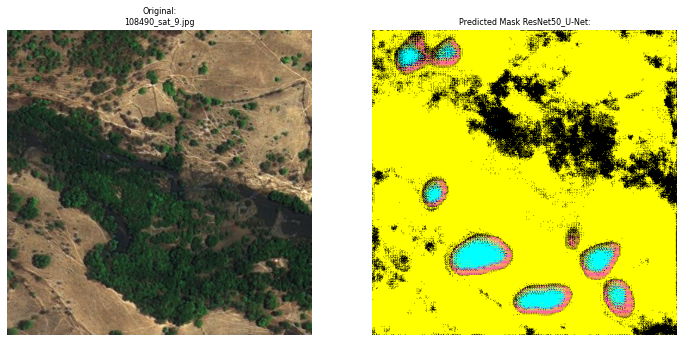

In [ ]:
# Randomly select test image then predict and plot prediction.
# Run this a few times to check on a few different image and prediction sets.
sanity_check(abspath_curr + '/data/test/', predict=True, model=model2, predicted_breakdown=False, imsize=transfer_learning_model_input_size[0])

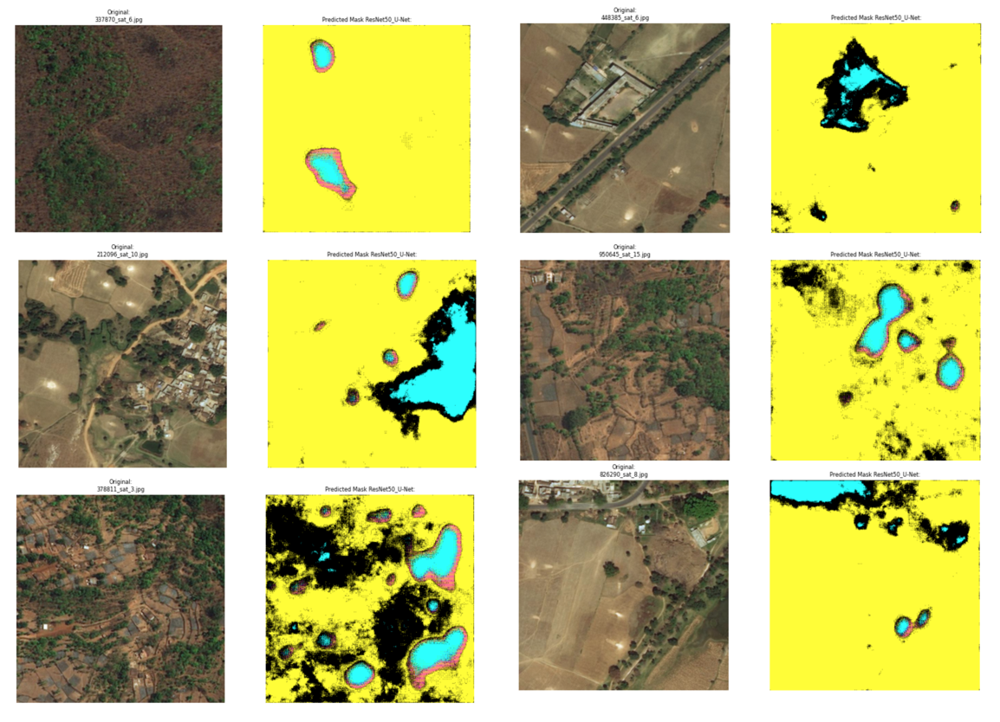

*Fig 13: Sample test predictions vs original image for ResNet50_U-Net architecture*

#### **6.2) U-Net Only Architecture Test Results**

Here are the U-Net only architecture test results.

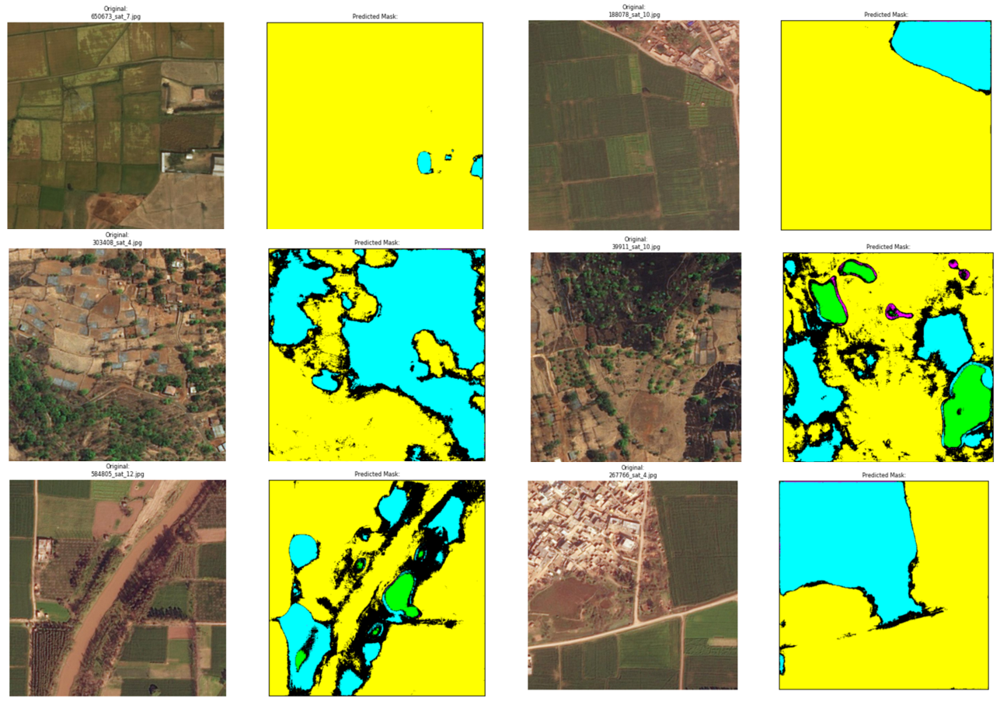

*Fig 14: Sample test predictions vs original image for U-Net only architecture*



Although the ResNet50_U-Net performed better than the U-Net only on the validation data, the U-Net seems to generalize better than the ResNet50_U-Net model.

## **7) Conclusion**

#### **7.1) Model Performance**

The ResNet50_U-Net model's performance had a validation dice coefficient of 0.803, a precision of 0.644, and recall of 0.734 while the U-Net had a validation dice coefficient of 0.784, a precision of 0.626, and recall of 0.663 

However, the U-Net only model is better to generalize on the test dataset and has generally cleaner segmentation edges than the ResNet50_U-Net model. With that said the performances of the two are quite close and although are not not amazing, are also not a bad start.

Due to the argriculture class being the majority class at 58%, both models did have some class imbalance issues and would try to guess agriculture for many instances. Along with argriculture, both models was still a decent segmenter of the urban class and some forest classes. However, both models can't seem to distinguish rangeland, barrenland, and water all that well from the other classes. 

Interestingly enough, both models also seems to be able to capture roads in some instances and would even classify those as urban even though that was not specifically labeled in the ground truth masks.

#### **7.2) Further Improvements**

Overall, these 2 models are a good start but can be further improved on in the following ways.

1.   Further fine tune how I handle class imbalance. 
  *  Implement custom class weighted loss function where a false positive gets penalized more by adding a larger weight and making it have a larger loss.
  *  Implement class weights through [Keras models'](https://keras.io/api/models/model_training_apis/)
     ```
     sample_weights = np.array([**class_weights])
     ```
     attribute. This is a little trickier as it only takes up to 2D matrices as inputs and since our images and masks are 3D, [we will need to flatten our images and reshape them after sample_weights have been applied in our model](https://github.com/keras-team/keras/issues/3653). 
  *  I did attempt an implementation of the weighted cross entropy loss but early testing results were not good. This may have just been my implementation however as documentation for this is not widely available for this in Keras. Perhaps a better implementation than my method can yield better results.


2.   Implement data augmentation
  *  Could implement small random image augmentations to provide more different types of training data to our model.
  *  This method will need to be done with both images and masks in sync to ensure masks still match images.
  *  We also had lots of training images already (11k images) so this may only yield marginal improvements to our model.

3.   Implement a more suitable pre-trained network for image segmentation tasks.

4.  Use grayscale images instead of colored images to force model to learn textures and tones instead of color may yield different, perhaps better, results.



#### **7.3) Additional Areas to Explore with this Type of Model**



1.   See how it generalizes to other forms of satellite and aerial imagery like a screenshot from Google Maps.
2.   Can we further adjust our model to predict for distance/depth to an object within satellite image? This will likely require some form of Lidar data as a form of ground truth.
3.   Can we tweak our data and model to identify individual trees or buildings?



## **8) References**

Dataset:

1.   [Kaggle](https://www.kaggle.com/balraj98/deepglobe-land-cover-classification-dataset)
2.   
  ```
  @InProceedings{DeepGlobe18,
  author = {Demir, Ilke and Koperski, Krzysztof and Lindenbaum, David and Pang, Guan and Huang, Jing and Basu, Saikat and Hughes, Forest and Tuia, Devis and Raskar, Ramesh},
  title = {DeepGlobe 2018: A Challenge to Parse the Earth Through Satellite Images},
  booktitle = {The IEEE Conference on Computer Vision and Pattern Recognition (CVPR) Workshops},
  month = {June},
  year = {2018}
  }
  ```
3. [DeepGlobe Land Cover Classification Challenge](https://competitions.codalab.org/competitions/18468)


Official Papers:

1.   [Long et al. (2015) Fully Convolutional Networks for Semantic Segmentation](https://www.cv-foundation.org/openaccess/content_cvpr_2015/papers/Long_Fully_Convolutional_Networks_2015_CVPR_paper.pdf)
2.   [Ronneberger et al. (2015) U-Net Convolutional Networks for Biomedical Image Segmentation](https://arxiv.org/abs/1505.04597)
3.   [Garbin et al. (2019) Batch Normalization vs Dropout](https://par.nsf.gov/servlets/purl/10166570)
4.   [Milletari et al.(2016) Dice Coefficient in V-Net](https://arxiv.org/pdf/1606.04797v1.pdf)



Additional Resources for FCNs and Segmentation:
1.   [Fully Convolutional Network](https://www.mygreatlearning.com/blog/fcn-fully-convolutional-network-semantic-segmentation/)
2.   [Guide to Semantic Segmentation](https://nanonets.com/blog/semantic-image-segmentation-2020/)
3.   [Understanding and Implementing a Fully Convolutional Network](https://towardsdatascience.com/implementing-a-fully-convolutional-network-fcn-in-tensorflow-2-3c46fb61de3b)
4.   [An Overview of Image Segmentation](https://www.jeremyjordan.me/semantic-segmentation/)
5.   [FCN vs U-Net](https://stackoverflow.com/questions/50239795/intuition-behind-u-net-vs-fcn-for-semantic-segmentation)
6.   [Simple Example of Semantic Segmentation](https://awaywithideas.com/a-simple-example-of-semantic-segmentation-with-tensorflow-keras/)
7.   [Metrics to Evaluate Semantic Segmentation Model](https://towardsdatascience.com/metrics-to-evaluate-your-semantic-segmentation-model-6bcb99639aa2)

Additional Resources for U-Nets:
1. [Humans Image Segmentation with Unet Using Tensorflow Keras](https://medium.com/analytics-vidhya/humans-image-segmentation-with-unet-using-tensorflow-keras-fd6cb43b06e5)
2. [UNET Implementation in TensorFlow using Keras API](https://idiotdeveloper.com/unet-implementation-in-tensorflow-using-keras-api/)
3. [U-Net for Segmenting Seismic Images with Keras](https://www.depends-on-the-definition.com/unet-keras-segmenting-images/)

Code Samples Referenced:

1.   [U-Net Architecture](https://github.com/zizhaozhang/unet-tensorflow-keras/blob/master/model.py)
3.   [Keras Sample Documentation](https://keras.io/examples/vision/deeplabv3_plus/)
4.   GWU Professor James Yuxiao Huang's [ML Pipeline](https://github.com/yuxiaohuang/teaching/blob/master/gwu/machine_learning_I/fall_2021/code/p3_deep_learning/p3_c2_supervised_learning/p3_c2_s3_convolutional_neural_networks/case_study/case_study.ipynb)
5.   [Keras Image Augmentation](https://keras.io/api/preprocessing/image/)
6.   [Keras Segmentation Metrics](https://keras.io/api/metrics/segmentation_metrics/)
7.   [Image Data Generators](https://stackoverflow.com/questions/56517963/keras-imagedatagenerator-for-segmentation-with-images-and-masks-in-separate-dire)
8.   [U-Net with ResNet50 Backbone](https://github.com/nikhilroxtomar/Semantic-Segmentation-Architecture/blob/main/TensorFlow/resnet50_unet.py)
